# Projeto Airbnb Rio - Ferramenta de Previsão de Preço de Imóvel para pessoas comuns 

### Contexto

No Airbnb, qualquer pessoa que tenha um quarto ou um imóvel de qualquer tipo (apartamento, casa, chalé, pousada, etc.) pode ofertar o seu imóvel para ser alugado por diária.

Você cria o seu perfil de host (pessoa que disponibiliza um imóvel para aluguel por diária) e cria o anúncio do seu imóvel.

Nesse anúncio, o host deve descrever as características do imóvel da forma mais completa possível, de forma a ajudar os locadores/viajantes a escolherem o melhor imóvel para eles (e de forma a tornar o seu anúncio mais atrativo)

Existem dezenas de personalizações possíveis no seu anúncio, desde quantidade mínima de diária, preço, quantidade de quartos, até regras de cancelamento, taxa extra para hóspedes extras, exigência de verificação de identidade do locador, etc.

### Nosso objetivo

Construir um modelo de previsão de preço que permita uma pessoa comum que possui um imóvel possa saber quanto deve cobrar pela diária do mesmo.

Ou ainda, para o locador comum, dado o imóvel que ele está buscando, ajudar a saber se aquele imóvel está com preço atrativo (abaixo da média para imóveis com as mesmas características) ou não.

### O que temos disponível, inspirações e créditos

As bases de dados foram retiradas do site kaggle: https://www.kaggle.com/allanbruno/airbnb-rio-de-janeiro

Caso queira uma outra solução, podemos olhar como referência a solução do usuário Allan Bruno do kaggle no Notebook: https://www.kaggle.com/allanbruno/helping-regular-people-price-listings-on-airbnb

Você vai perceber semelhanças entre a solução que vamos desenvolver aqui e a dele, mas também algumas diferenças significativas no processo de construção do projeto.

- As bases de dados são os preços dos imóveis obtidos e suas respectivas características em cada mês.
- Os preços são dados em reais (R$)
- Temos bases de abril de 2018 a maio de 2020, com exceção de junho de 2018 que não possui base de dados

### Expectativas Iniciais

- Acredito que a sazonalidade pode ser um fator importante, visto que meses como dezembro costumam ser bem caros no RJ
- A localização do imóvel deve fazer muita diferença no preço, já que no Rio de Janeiro a localização pode mudar completamente as características do lugar (segurança, beleza natural, pontos turísticos)
- Adicionais/Comodidades podem ter um impacto significativo, visto que temos muitos prédios e casas antigos no Rio de Janeiro

Vamos descobrir o quanto esses fatores impactam e se temos outros fatores não tão intuitivos que são extremamente importantes.

### Importar Bibliotecas e Bases de Dados

In [1]:
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split
import time

In [2]:
caminho_bases = pathlib.Path('dataset')

dic_meses = {'jan': 1, 'fev': 2, 'mar': 3, 'abr': 4, 'mai': 5, 'jun': 6, 'jul': 7, 'ago': 8, 'set': 9, 'out': 10, 'nov': 11, 'dez': 12}

base_airbnb = pd.DataFrame() #cria um dataframe (tabela) vazio

lista_aux_bases = [] #lista auxiliar para armazenar todos os dataframes (df)

# O bloco abaixo nos permite iterar sobre todos os arquivos da pasta 'dataset', armazenando cada tabela num df e cada df dentro da lista auxiliar
for arquivo in caminho_bases.iterdir():
    # Separa o número do mês a partir do nome do arquivo. Ex: abril2018.csv -> mes= 4
    nome_mes = arquivo.name[:3]
    mes = int(dic_meses[nome_mes])
    
    # Separa o número do ano a partir do nome do arquivo. Ex: abril2018.csv -> ano= 2018
    ano = arquivo.name[-8:]
    ano = int(ano.replace('.csv', ''))
    
    df_aux = pd.read_csv(caminho_bases / arquivo.name, low_memory=False) #lê o arquivo .csv e armazena num df auxiliar
    
    df_aux['ano'] = ano #acrescenta a coluna 'mês' no df auxiliar
    df_aux['mês'] = mes #acrescenta a coluna 'ano' no df auxiliar
    
    lista_aux_bases.append(df_aux) #acrescenta o df auxiliar na lista auxiliar

### Consolidar Base de Dados

In [3]:
base_airbnb = pd.concat(lista_aux_bases) #utiliza a lista auxiliar para concatenar todos os df numa única tabela (dataframe 'base_airbnb')

display(base_airbnb)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34324,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
34325,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
34326,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
34327,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


### Se tivermos muitas colunas, já vamos identificar quais delas podemos excluir

- Nossas bases de dados possuem muitas colunas, o que faz nosso modelo ficar muito lento e difícil de trabalhar.
- Em análise rápida, percebemos que várias das colunas existentes não são necessárias para nosso modelo de previsão, portanto vamos excluir algumas dessas colunas da nossa base.
- Tipos de colunas que vamos excluir:
    1. IDs, links e informações irrelevantes para o modelo
    2. Colunas repetidas ou extremamente parecidas com outra (que dão a mesma informação para o modelo). Ex: Data x Ano/Mês
    3. Colunas preenchidas com texto livre, pois não rodaremos nenhum algoritmo de análise de palavras nem nada parecido
    4. Colunas em que todos ou quase todos os valores são iguais e/ou nulos
    5. Colunas que podem ser redundantes com outra. Ex: Latitude e Longitude excluem a necessidade de manter todas as várias colunas que armazenam informações como País, CEP, Cidade, Endereço, etc.
- Para nos auxiliar nesta análise, vamos criar um arquivo em Excel com as primeiras 1000 linhas e fazer uma análise qualitativa.

In [4]:
# Gera o arquivo .csv que será aberto no Excel para análise qualitativa
base_airbnb.head(1000).to_csv("Primeiros_registros.csv", sep=';')

In [5]:
# Vamos analisar se a coluna 'experiences_offered' possui dados relevantes
print(base_airbnb['experiences_offered'].value_counts())

# O resultado indica que todas os valores de 'experiences_offered' são iguais (none), portanto não há relevância para o modelo e,
# então, podemos excluir a coluna da nossa base.

none    902210
Name: experiences_offered, dtype: int64


In [6]:
# Durante a análise qualitativa que fazíamos, desconfiamos que duas colunas possuíam dados iguais. Para confirmar a suspeita,
# vamos rodar uma linha de código para averiguar quanto os dados se repetem entre as colunas
print((base_airbnb['host_listings_count'] == base_airbnb['host_total_listings_count']).value_counts())

# O resultado indica que dos 902210 registros, há apenas 460 ocorrências onde os registros não se repetem entre as duas colunas,
# ou seja, a diferença entre as colunas é irrisória e, portanto, é razoável optar por excluir uma delas.

True     901750
False       460
dtype: int64


In [7]:
# A coluna 'square_feet' parecia ser uma informação relevante para o modelo, porém notamos durante a análise que muitos dos registros
# eram nulos. Para averiguar a viabilidade da utilização desta coluna, vamos verificar quantitativamente quantos registros são
# de fato nulos
print(base_airbnb['square_feet'].isnull().sum())

# O resultado indica que dos 902210 registros, há 888162 ocorrências de dados nulos, ou seja, apesar de ser um dado que julgamos
# ser relevante para o modelo, infelizmente a base que temos possui um baixíssimo percentual de dados preenchidos (não nulos).
# Sendo assim, é sensato excluir a coluna da nossa base.

888162


- Depois da análise qualitativa das colunas, levando em conta os critérios explicados acima, ficamos com as seguintes colunas:

In [8]:
colunas = ['host_response_time','host_response_rate','host_is_superhost','host_listings_count','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','amenities','price','security_deposit','cleaning_fee','guests_included','extra_people','minimum_nights','maximum_nights','number_of_reviews','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy','ano','mês']

base_airbnb_aj = base_airbnb.loc[:, colunas]
display(base_airbnb_aj)

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,latitude,longitude,property_type,room_type,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,ano,mês
0,NaN,NaN,f,1.0,-22.946854,-43.182737,Apartment,Entire home/apt,4,1.0,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,2018,4
1,within an hour,100%,t,2.0,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,2018,4
2,within an hour,100%,f,1.0,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
3,within an hour,100%,f,3.0,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
4,within an hour,100%,t,1.0,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,2018,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34324,within an hour,93%,f,0.0,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
34325,NaN,NaN,f,0.0,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
34326,within a few hours,74%,f,32.0,-22.962080,-43.175520,Apartment,Entire home/apt,5,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9
34327,NaN,NaN,f,0.0,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9


<b>Obs.: </b>É importante frisar que toda e qualquer análise qualitativa de uma base de dados contém o viés opinativo do analista em questão. Apesar da presença de algumas colunas serem consideradas consenso, outras tantas colunas podem ou não serem consideradas importantes para o modelo dependendo da visão do analista que o está construindo. Sendo assim, cabe ao próprio modelo se provar assertivo ou não, de modo que, caso não se prove, o analista volte a ele e faça uma nova análise de refinamento, podendo inclusive acrescentar (ou excluir) colunas que a princípio não estavam na modelagem original.

### Tratar Valores Faltando (NaN ou Nulos)

In [9]:
# Vamos primeiro analisar quantos valores NaN (Nulos) cada coluna possui, para termos alguma base numérica de decisão
print(base_airbnb_aj.isnull().sum())

# O resultado indica que existem muitas colunas que possuem 0 registros nulos, o que é bom para o modelo, porém algumas outras 
# possuem um número considerável de ocorrências nulas, chegando a quase 50% de casos. A partir desse ponto, precisaremos tomar
# algumas decisões sobre o que fazer com essas colunas.

host_response_time             401843
host_response_rate             401846
host_is_superhost                 460
host_listings_count               460
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bathrooms                        1724
bedrooms                          850
beds                             2502
bed_type                            0
amenities                           0
price                               0
security_deposit               421280
cleaning_fee                   313506
guests_included                     0
extra_people                        0
minimum_nights                      0
maximum_nights                      0
number_of_reviews                   0
review_scores_rating           448016
review_scores_accuracy         448586
review_scores_cleanliness      448413
review_scores_checkin          448650
review_score

- Quando nos deparamos com uma situação como essa, isto é, colunas com alto índice de valores nulos, geralmente temos 2 caminhos a seguir:
    1. Excluir a coluna inteira do modelo
    2. Manter a coluna, mas excluir as linhas com dados nulos
- Ambas as alternativas possuem prós e contras e sua eficiência varia muito de acordo com o contexto da base (grau de relevância da coluna, quantidade de dados nulos, etc)
- Avaliando nossa base, tomamos a decisão de excluir do nosso modelo as colunas que possuem mais de 300 mil registros nulos, pois as demais possuem um baixo índice de registros nulos e podem ser tratadas com mais cuidado no caso-a-caso.
- Para as demais colunas, vamos optar por excluir apenas as linhas que possuem ocorrência do NaN, pois como temos um alto volume de dados totais (mais de 900 mil), essas exclusões pouco impactarão na nossa análise.

In [10]:
# Percorre todas as colunas da base, verifica se a soma de valores nulos é maior que 300 mil e, caso seja, exclui a coluna da base
for coluna in base_airbnb_aj:
    if base_airbnb_aj[coluna].isnull().sum() > 300000:
        base_airbnb_aj = base_airbnb_aj.drop(coluna, axis=1)

print(base_airbnb_aj.isnull().sum()) #print para verificar que as colunas foram de fato excluídas

host_is_superhost            460
host_listings_count          460
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                   1724
bedrooms                     850
beds                        2502
bed_type                       0
amenities                      0
price                          0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
instant_bookable               0
is_business_travel_ready       0
cancellation_policy            0
ano                            0
mês                            0
dtype: int64


In [11]:
print(base_airbnb_aj.shape) #printa a tupla com (qtde de linhas, qtde de colunas) do nosso df

base_airbnb_aj = base_airbnb_aj.dropna() #exclui todas as linhas que possuem NaN

print(base_airbnb_aj.shape) #valida se a exclusão foi feita, avaliando se a qtde de linhas reduziu

(902210, 23)
(897709, 23)


### Verificar Tipos de Dados em cada coluna

In [12]:
print(base_airbnb_aj.dtypes) #confere que tipo de dado cada coluna possui

print('-'*100) #apenas um separador visual

print(base_airbnb_aj.iloc[0]) #printa a primeira linha de cada coluna

# O resultado nos permitirá analisar de que tipo os dados de cada coluna estão sendo interpretados pelo Pandas e, além disso,
# poderemos observar um exemplo de cada coluna a fim de entender porquê, possivelmente, uma das colunas não está sendo interpretada
# conforme esperávamos.

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mês                           int64
dtype: object
----------------------------------------------------------------------------------------------------
host_is_superhost                                        

- Analisando o resultado obtido, percebemos que há duas colunas que estão sendo interpretadas como 'object', porém gostaríamos que fossem transformadas em 'float', para fins de cálculos e análises estatísticas futuras. São elas:
    1. price (preço)
    2. extra_people (pessoas extras)
- As demais colunas, segundo análise, não são necessárias nenhum tipo de tratamento de tipo.

In [13]:
# Provavelmente o Pandas está interpretando as colunas 'price' e 'extra_people' como tipo 'object' devido ao fato de que os dados
# contidos nelas possuírem um separador de milhar (.) e o sifrão ($). Sendo assim, vamos removê-los e tentar forçar a conversão
# para o tipo 'float'

# Coluna price
base_airbnb_aj['price'] = base_airbnb_aj['price'].str.replace('$', '', regex=True) #substitui o '$' por vazio
base_airbnb_aj['price'] = base_airbnb_aj['price'].str.replace(',', '', regex=True) #substitui o separador ',' por vazio
base_airbnb_aj['price'] = base_airbnb_aj['price'].astype(np.float32, copy=False) #converte os dados para o tipo 'float32'

# Coluna extra_people
base_airbnb_aj['extra_people'] = base_airbnb_aj['extra_people'].str.replace('$', '', regex=True)
base_airbnb_aj['extra_people'] = base_airbnb_aj['extra_people'].str.replace(',', '', regex=True)
base_airbnb_aj['extra_people'] = base_airbnb_aj['extra_people'].astype(np.float32, copy=False)

# Verificando se as alterações funcionaram
print(base_airbnb_aj.dtypes)

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                       float32
guests_included               int64
extra_people                float32
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mês                           int64
dtype: object


### Análise Exploratória e Tratar Outliers

- Vamos basicamente olhar feature (coluna) por feature para:
    1. Ver a correlação entre as features e decidir se manteremos todas as features que temos.
    2. Excluir outliers (usaremos como regra, valores abaixo de Q1 - 1.5xAmplitude e valores acima de Q3 + 1.5x Amplitude). Amplitude = Q3 - Q1
    3. Confirmar se todas as features que temos fazem realmente sentido para o nosso modelo ou se alguma delas não vai nos ajudar e se devemos excluir
    
- Vamos começar pelas colunas de preço (resultado final que queremos) e de extra_people (também valor monetário). Esses são os valores numéricos contínuos.

- Depois vamos analisar as colunas de valores numéricos discretos (accomodates, bedrooms, guests_included, etc.)

- Por fim, vamos avaliar as colunas de texto e definir quais categorias fazem sentido mantermos ou não.

<b>MAS CUIDADO:</b> não devemos sair excluindo outliers sem critério nenhum. Temos que pensar exatamente no que estamos fazendo. Se não tem um motivo claro para remover o outlier, talvez não seja necessário e pode ser prejudicial para a generalização. Então devemos balancear nosso critério de exclusão. Claro que sempre podemos testar e ver qual fornece o melhor resultado, mas fazer isso para todas as features pode dar muito trabalho e consumir bastante tempo.

Exemplo de análise: Se o objetivo é ajudar a precificar um imóvel que você está querendo disponibilizar, excluir outliers em host_listings_count pode fazer sentido. Agora, se você é uma empresa com uma série de propriedades e quer comparar com outras empresas do tipo também e se posicionar dessa forma, talvez excluir quem tem acima de 6 propriedades tire isso do seu modelo. Devemos sempre pensar bem no nosso objetivo antes de tomar uma decisão.

<AxesSubplot:>

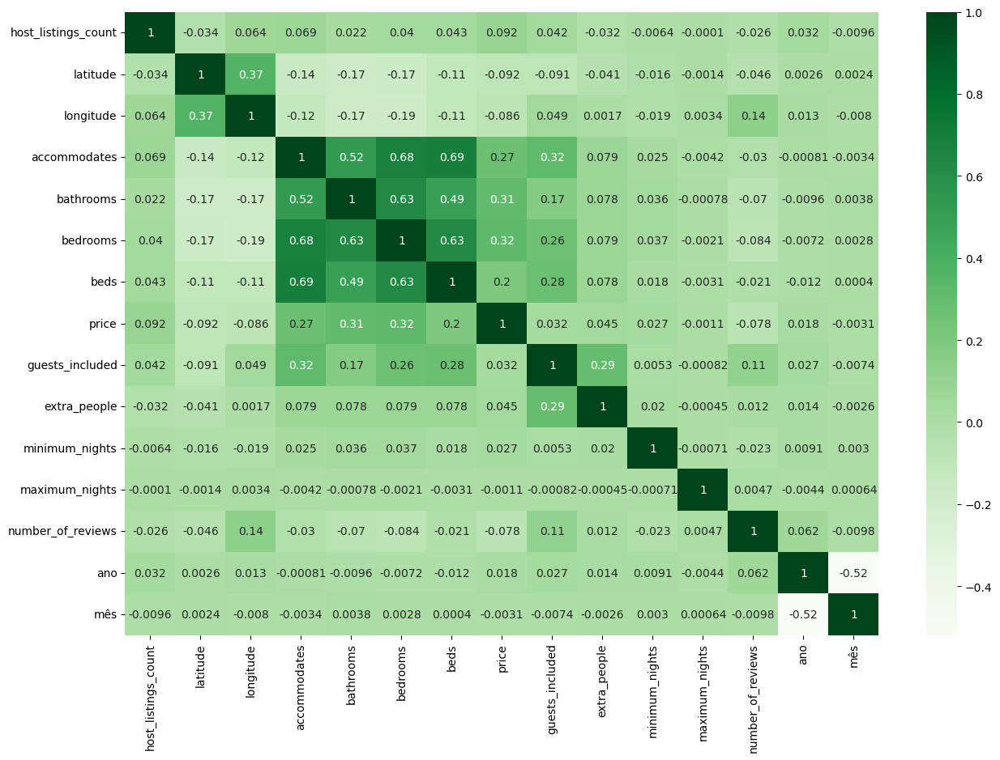

In [14]:
# Vamos analisar a correlação entre os dados (colunas). Para tal, um mapa de calor costuma ser o mais visual para a análise

plt.figure(figsize=(15, 10))
sns.heatmap(base_airbnb_aj.corr(), annot=True, cmap='Greens')

- Analisando o gráfico plotado, não percebemos nenhuma das colunas possuindo uma correlação forte o suficiente com outra para justificar a exclusão dela do nosso modelo.
    - Apesar da relativa (e esperada) alta correlação entre a quantidade de acomadações, número de quartos, número de banheiros e número de camas, é opinião deste analista que a ordem de grandeza ainda não justifica a exclusão ou refino dos dados destas colunas. Vamos seguir normalmente com o desenvolvimento do nosso modelo.
    - É importante entender que colunas que possuem forte correlação tendem a introduzir demasiado viés no nosso modelo, pois indicam redundância na base de dados e, consequentemente, maior influência no resultado gerado pelo modelo. Sendo assim, o mais indicado nesses casos é a exclusão de uma das colunas, para reduzir o impacto deste viés.

- Vamos definir algumas funções ara ajudar na análise de outliers das colunas:

In [15]:
def limites(coluna):
    """Função que define os limites inferior e superior do conjunto de dados contido na coluna passada como parâmetro"""
    q1 = coluna.quantile(0.25) #calcula o primeiro quartil (Q1)
    q3 = coluna.quantile(0.75) #calcula o terceiro quartil (Q3)
    amplitude = q3 - q1 #calcula a amplitude (Q3 - Q1)
    lim_inferior = q1 - 1.5 * amplitude #calcula o limite inferior
    lim_superior = q3 + 1.5 * amplitude #calcula o limite superior
    return lim_inferior, lim_superior

def excluir_outliers(df, nome_coluna):
    """Função que exclui as linhas de um dataframe cujos dados estejam fora do limite do conjunto (outliers)"""
    qtde_linhas = df.shape[0] #armazena a qtde inicial de linhas q o df possui antes de ter seus outliers removidos
    lim_inf, lim_sup = limites(df[nome_coluna]) #utiliza da função 'limites' para definir os limites inferiores e superiores do conjunto
    df = df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :] #filtra o df, baseado na coluna passada, de maneira que todos os dados contidos estejam entre os dois limites (exclui os outliers)
    linhas_removidas = qtde_linhas - df.shape[0] #calcula a qtde de linhas removidas
    return df,  linhas_removidas #retorna o df filtrado e o número de linhas removidas

def diagrama_caixa(coluna):
    """Função que plota um diagrama de caixa (boxplot) para a coluna passada como parâmetro.
    A função plota dois gráficos, o primeiro sendo um boxplot sem limitação de dados no eixo x e o segundo sendo um boxplot
    que limita o eixo x do boxplot à apenas os dados dentro dos limites definidos na função 'limites()' """
    # O bloco abaixo define a área de plot do gráfico, no caso, 1 linha e 2 colunas, possuindo extensão de 15 polegas em x e 5 em y
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 5)
    
    sns.boxplot(x=coluna, ax=ax1) #plota o boxplot do primeiro gráfico (sem limitação de dados em x)
    ax2.set_xlim(limites(coluna)) #define o limite de dados no eixo x para o segundo gráfico
    sns.boxplot(x=coluna, ax=ax2) #plota o boxplot do segundo gráfico (com a limitação definida acima)
    
def histograma(coluna):
    """Função que plota um histograma baseado nos dados da coluna passada como parâmetro"""
    plt.figure(figsize=(15, 5)) #define a área do gráfico
    sns.histplot(coluna, kde=True, stat='density') #plota o gráfico (histograma)
#     sns.distplot(coluna, hist=True) #plota o gráfico (histograma)

def grafico_barra(coluna):
    """Função que plota um gráfico de barras baseado nos dados da coluna passada como parâmetro"""
    plt.figure(figsize=(15, 5)) #define a área do gráfico
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts()) #plota o gráfico, sendo y = a contagem de valores da coluna passada e x = o número do índice dessa contagem
    ax.set_xlim(limites(coluna)) #define o limite de dados no eixo x

#### Coluna "price"

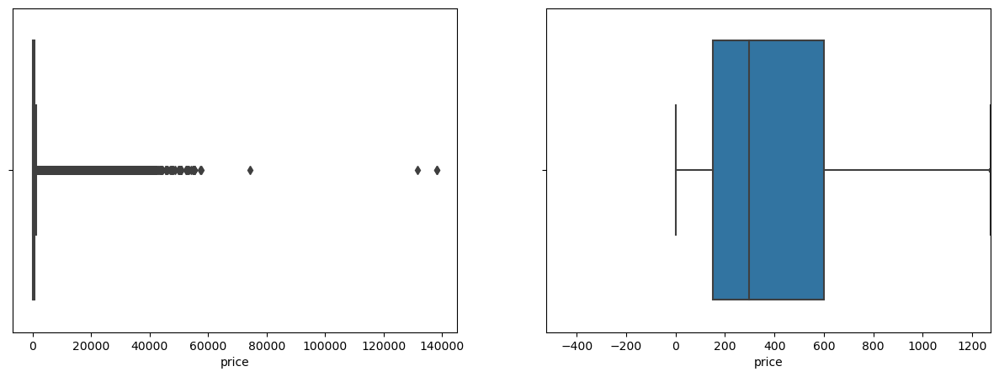

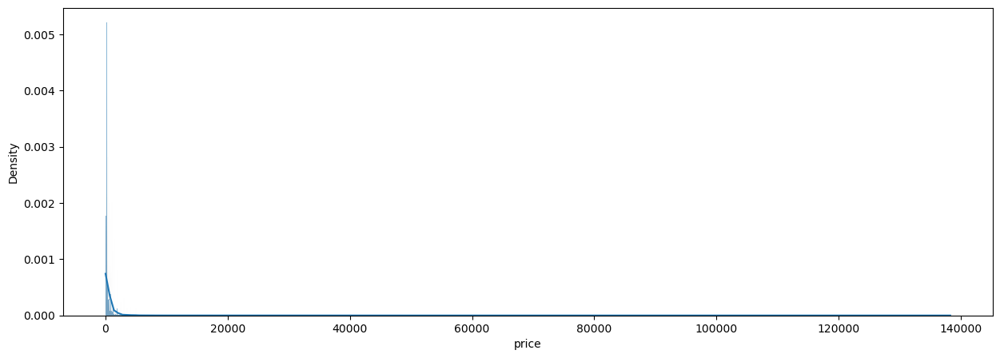

In [16]:
diagrama_caixa(base_airbnb_aj['price'])
histograma(base_airbnb_aj['price'])

Como estamos construindo um modelo para imóveis comuns, acredito que os valores acima do limite superior serão apenas de apartamentos de altíssimo luxo, que não é o nosso objetivo principal. Por isso, podemos excluir esses outliers.

In [17]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'price')
print('{} linhas removidas'.format(linhas_removidas))

87282 linhas removidas


A qtde excluída representa pouco menos de 10% da base total. Apesar de não ser desprezível, entendemos que para maior assertividade do modelo, cujo principal objetivo está focado em apartamentos comuns (e não de luxo), excluir os outliers faz sentido e ainda mantém uma boa quantidade de dados para análise.

(810427, 23)


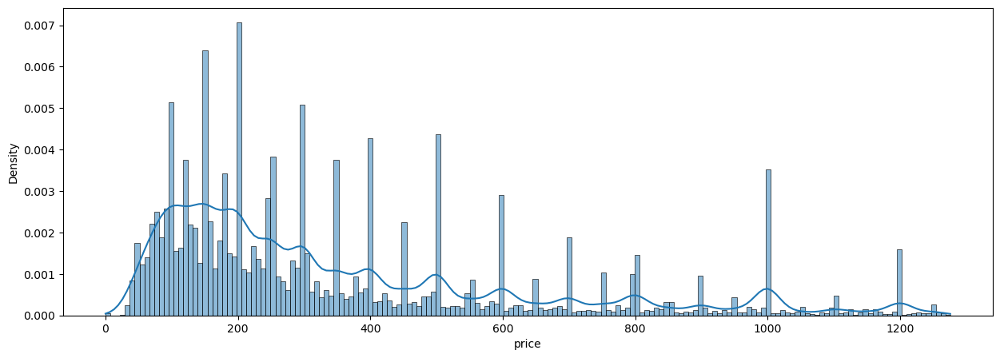

In [18]:
# Vamos plotar o histograma, agora sem os outliers. A leitura deve ser muito mais clara e conclusiva do que antes.

histograma(base_airbnb_aj['price'])
print(base_airbnb_aj.shape)

#### Coluna "extra_price"

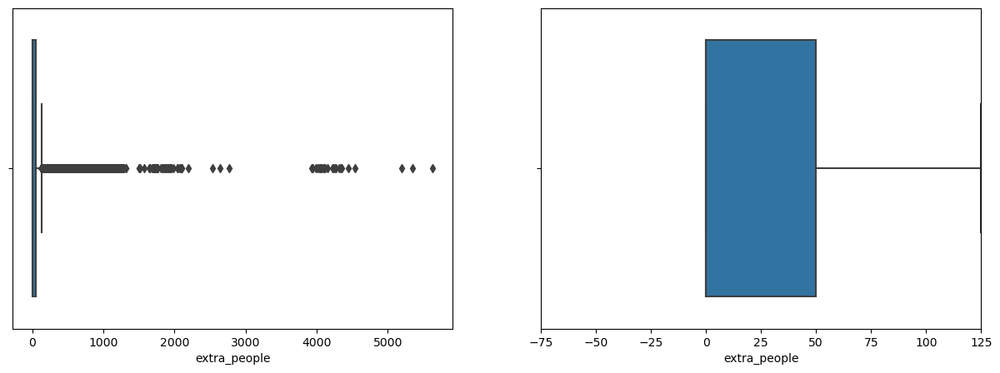

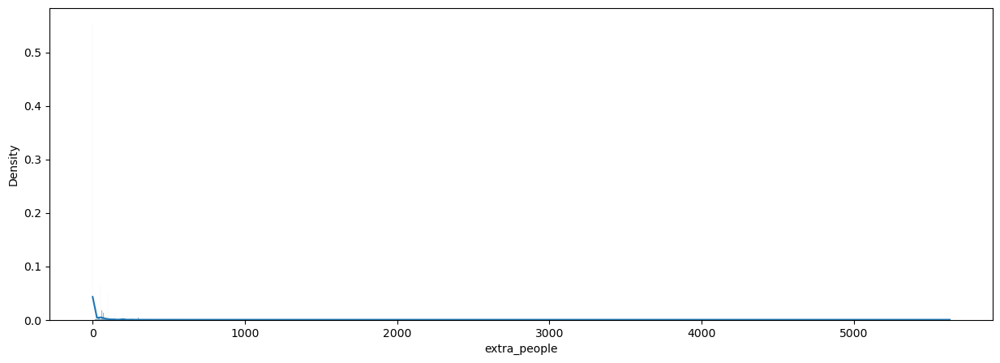

In [19]:
diagrama_caixa(base_airbnb_aj['extra_people'])
histograma(base_airbnb_aj['extra_people'])

Para a coluna "extra_people", a decisão foi or tirar os outliers também. Ao final, após finalização do nosso modelo, podemos estressá-lo incluindo esses outliers e analisando o comportamento, caso seja do nosso interesse realizar esse teste.

In [20]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'extra_people')
print('{} linhas removidas'.format(linhas_removidas))

59194 linhas removidas


(751233, 23)


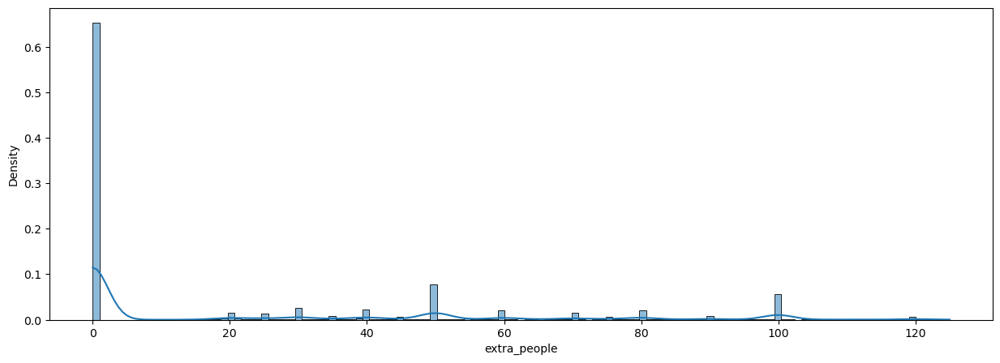

In [21]:
histograma(base_airbnb_aj['extra_people'])
print(base_airbnb_aj.shape)

#### Coluna "host_listings_count"

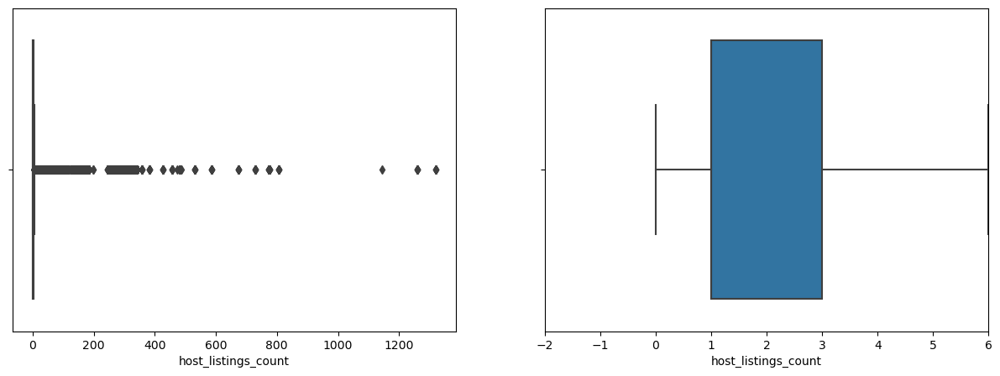

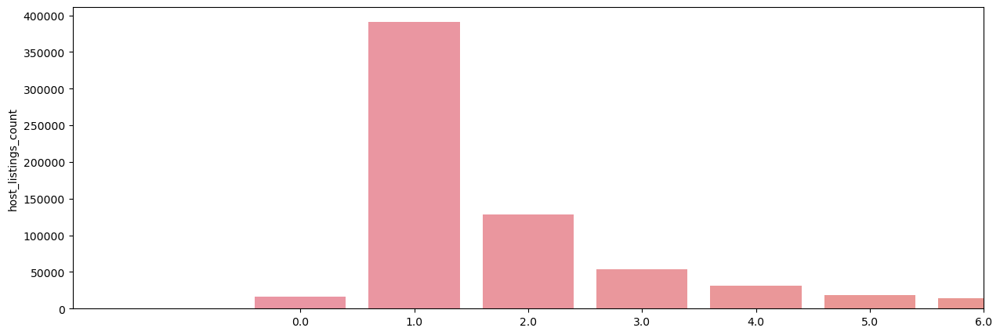

In [22]:
diagrama_caixa(base_airbnb_aj['host_listings_count'])
grafico_barra(base_airbnb_aj['host_listings_count'])

# Utilizar um gráfico de barras deixa a visualização dos dados das colunas com valores descritivos muito melhor do que o histograma
# pois o eixo x não é consolidado.

Podemos excluir os outliers, pois para o objetivo do nosso projeto, hosts com mais de 6 imóveis no airbnb não se encaixam no público alvo do estudo (podemos pressupor que estes outliers sejam imobiliários ou profissionais que gerenciam imóveis no airbnb)

In [23]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'host_listings_count')
print('{} linhas removidas'.format(linhas_removidas))

97723 linhas removidas


#### Coluna "accommodates"

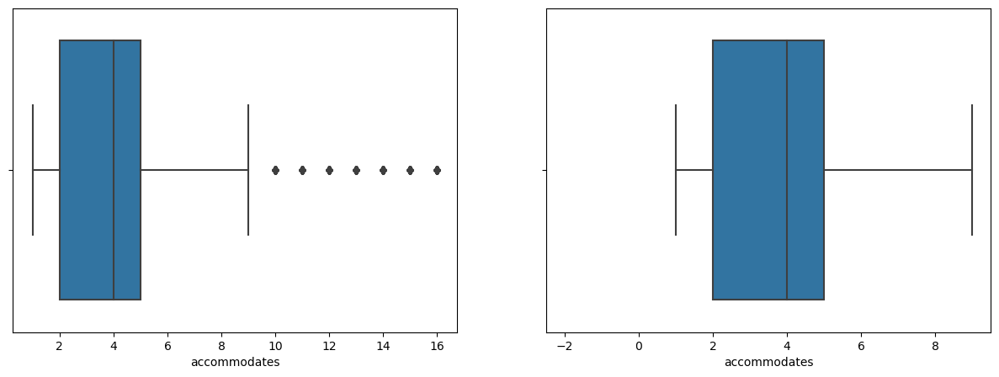

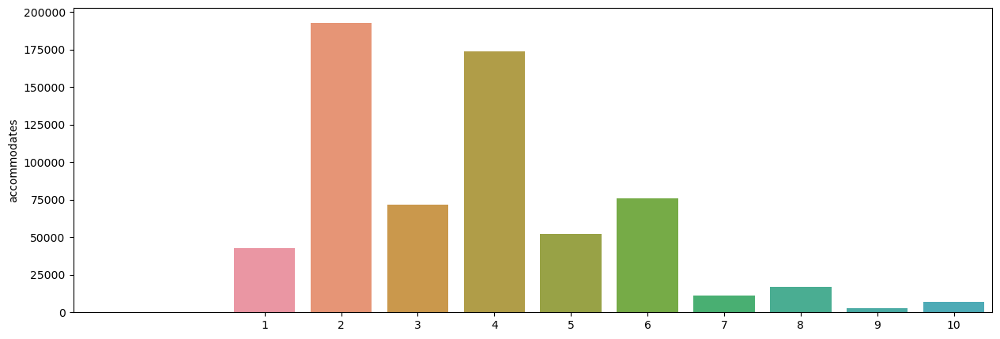

In [24]:
diagrama_caixa(base_airbnb_aj['accommodates'])
grafico_barra(base_airbnb_aj['accommodates'])

- Pelo mesmo motivo do "host_listings_count", vamos excluir os outliers dessa coluna porque apartamentos que acomodam mais de 9 pessoas não são o nosso foco. Nosso objetivo aqui é para imóveis comuns.

- Caso quiséssemos incluir apartamentos de alto padrão, poderíamos manter essa variável ou então construir um modelo só focado em imóveis com mais de 9 hóspedes.

In [25]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'accommodates')
print('{} linhas removidas'.format(linhas_removidas))

13146 linhas removidas


#### Coluna "bathrooms"

<AxesSubplot:ylabel='bathrooms'>

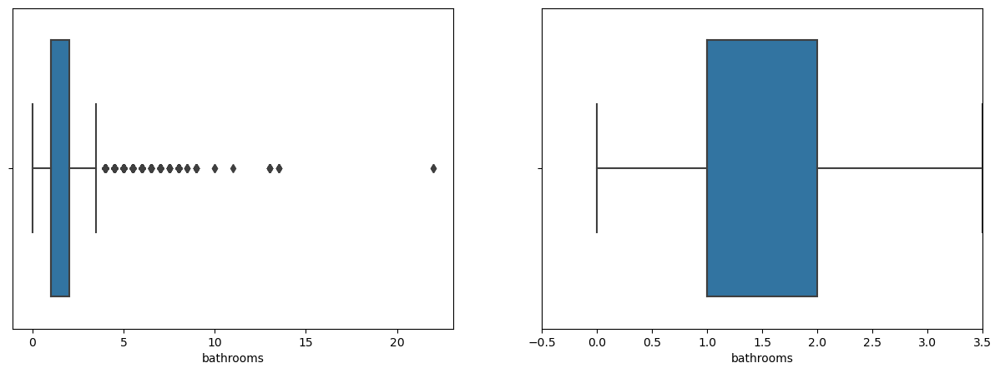

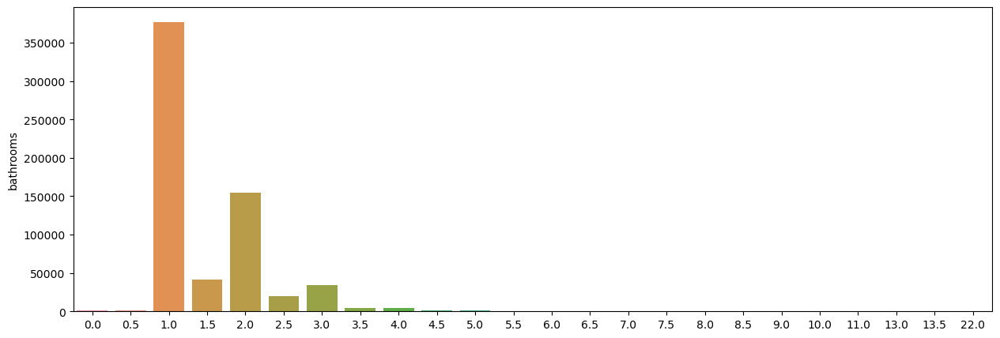

In [26]:
# Se realizarmos a função abaixo normalmente, vamos ter um problema na visualização do gráfico devido aos valores dos limites
# calculados para esse coluna. Descomente o bloco abaix e rode o código, caso queira observar o "erro":
# 
# diagrama_caixa(base_airbnb_aj['bathrooms'])
# grafico_barra(base_airbnb_aj['bathrooms'])

# Por se tratar apenas de uma dificuldade de visualização, podemos tratá-lo especificamente para este caso, sem a necessidade
# de alterar a função principal. Vamos plotar o gráfico de barras sem os limites no eixo x:

diagrama_caixa(base_airbnb_aj['bathrooms'])
plt.figure(figsize=(15, 5))
sns.barplot(x=base_airbnb_aj['bathrooms'].value_counts().index, y=base_airbnb_aj['bathrooms'].value_counts())

- Pelo mesmo motivo dos anteriores, vamos excluir os outliers nos banheiros

In [27]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'bathrooms')
print('{} linhas removidas'.format(linhas_removidas))

6894 linhas removidas


#### Coluna "bedrooms"

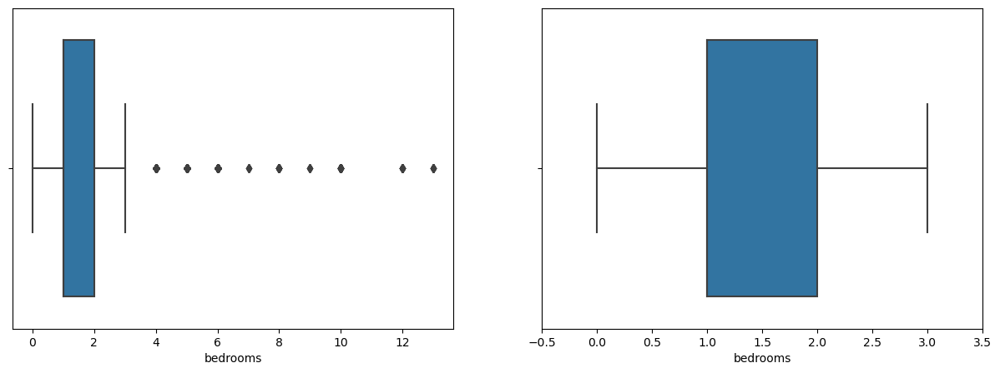

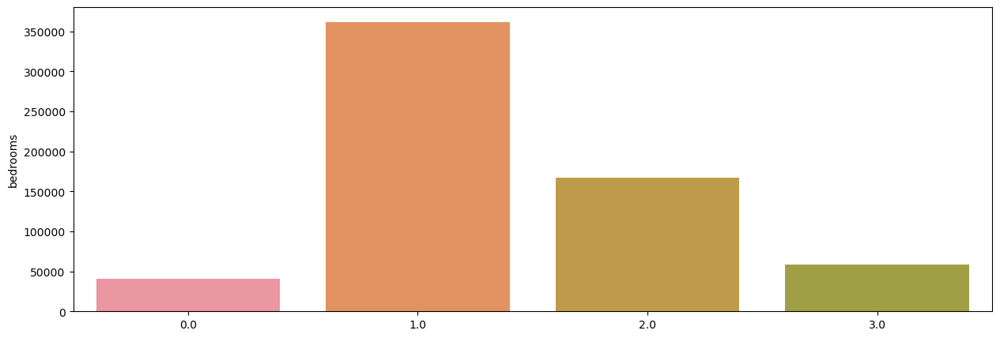

In [28]:
diagrama_caixa(base_airbnb_aj['bedrooms'])
grafico_barra(base_airbnb_aj['bedrooms'])

- Pelo mesmo motivo dos anteriores, vamos excluir outliers em quantidade de quartos

In [29]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'bedrooms')
print('{} linhas removidas'.format(linhas_removidas))

5482 linhas removidas


#### Coluna "beds"

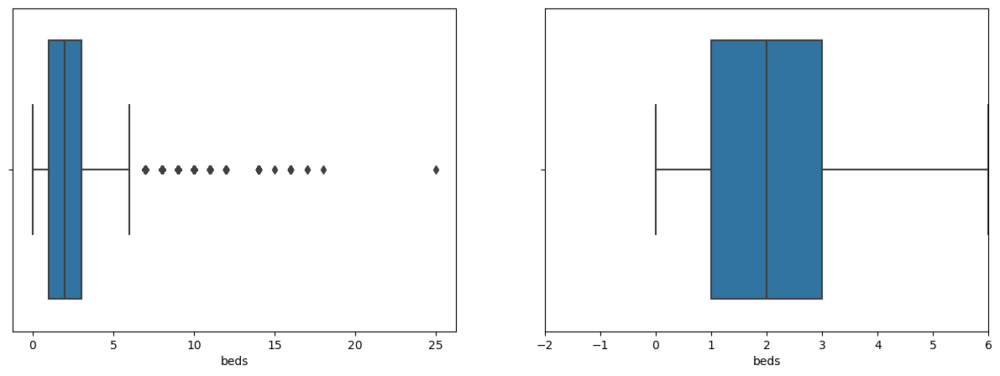

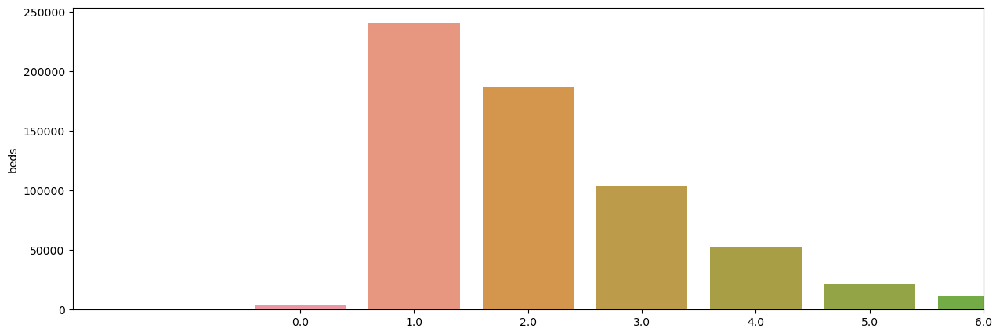

In [30]:
diagrama_caixa(base_airbnb_aj['beds'])
grafico_barra(base_airbnb_aj['beds'])

- Pelo mesmo motivo dos anteriores, vamos excluir outliers em quantidade de quartos

In [31]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'beds')
print('{} linhas removidas'.format(linhas_removidas))

5622 linhas removidas


#### Coluna "guests_included"

C:\Users\lucas\AppData\Local\Temp\ipykernel_25900\1477392709.py:27: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax2.set_xlim(limites(coluna)) #define o limite de dados no eixo x para o segundo gráfico
C:\Users\lucas\AppData\Local\Temp\ipykernel_25900\1477392709.py:40: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(limites(coluna)) #define o limite de dados no eixo x


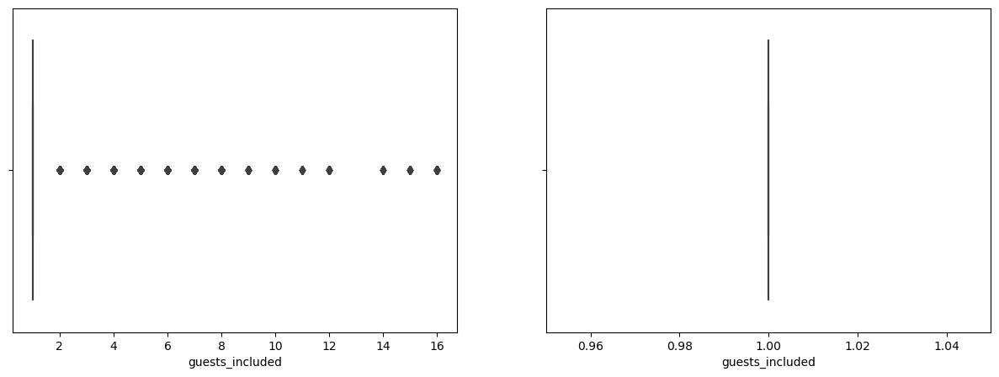

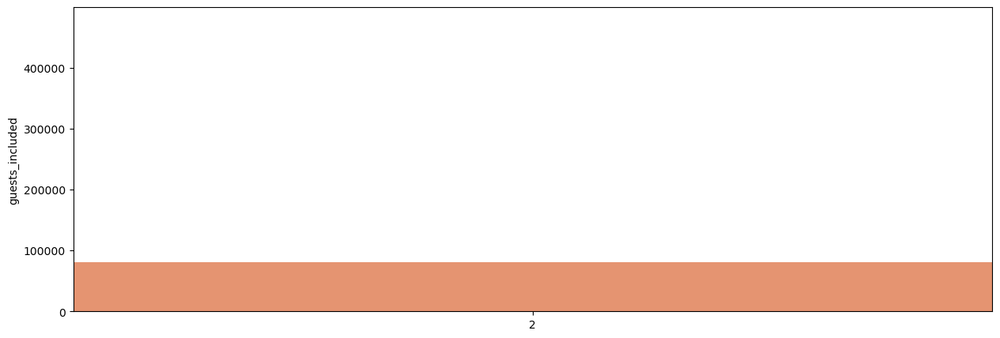

In [32]:
# Para a coluna de "guests_included", incorremos em mais um problema, mas que não é apenas de visualização. Analisemos o 
# resultado dos gráficos plotados abaixo:

diagrama_caixa(base_airbnb_aj['guests_included'])
grafico_barra(base_airbnb_aj['guests_included'])

Por algum motivo, os limites inferiores e superiores dessa coluna parecem estar próximo demais ou, talvez, até sejam os mesmos. Vamos printar os valores desses limites e vamos plotar o gráfico sem os limites, para compreender melhor esse comportamento:

Os limites são: (1.0, 1.0)


<AxesSubplot:ylabel='guests_included'>

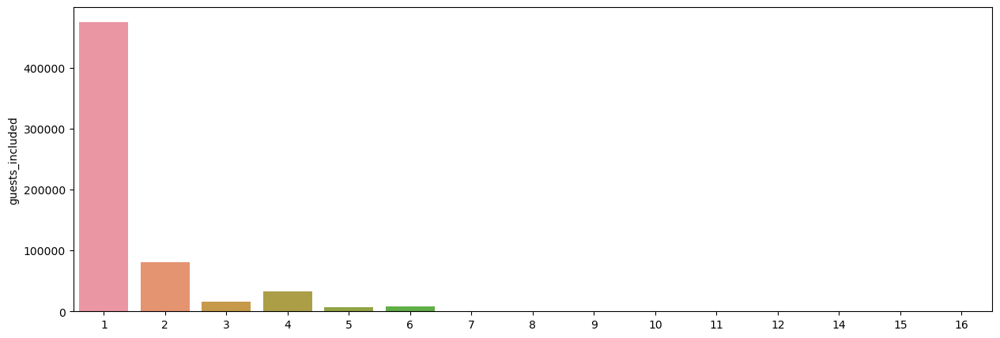

In [33]:
print("Os limites são:", limites(base_airbnb_aj['guests_included']))
plt.figure(figsize=(15, 5))
sns.barplot(x=base_airbnb_aj['guests_included'].value_counts().index, y=base_airbnb_aj['guests_included'].value_counts())

De fato, os limites inferiores e superiores são numericamente idênticos. Ao analisarmos o gráfico, porém, temos um comportamento estranho. Parece que os usuários do airbnb usam muito o valor padrão do airbnb, que seria definir como 1 o valor de guest included. Isso pode levar o nosso modelo a considerar uma feature que na verdade não é essencial para a definição do preço, afinal o gráfico demonstra que esta informação parece ser de baixa qualidade, isto é, não parece que os usuários preenchem este campo com a devida precisão. Por isso, parece razoável excluir a coluna da análise e garantir que nosso modelo só irá considerar informações relevantes e de qualidade.

In [34]:
# Vamos remover essa coluna da análise

print(base_airbnb_aj.shape) #conferindo quantas colunas existiam antes da exclusão
base_airbnb_aj = base_airbnb_aj.drop('guests_included', axis=1) #excluindo a coluna "guests_included"
print(base_airbnb_aj.shape) #confirmando que a qtde de colunas, de fato, diminuiu

(622366, 23)
(622366, 22)


#### Coluna "minimum_nights"

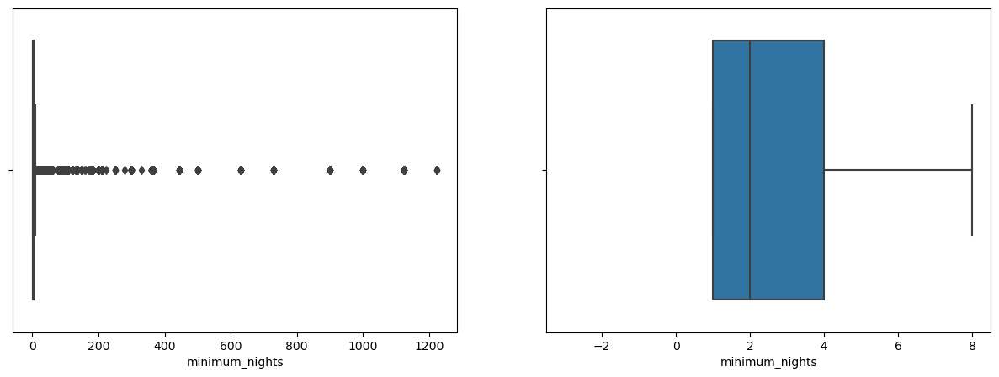

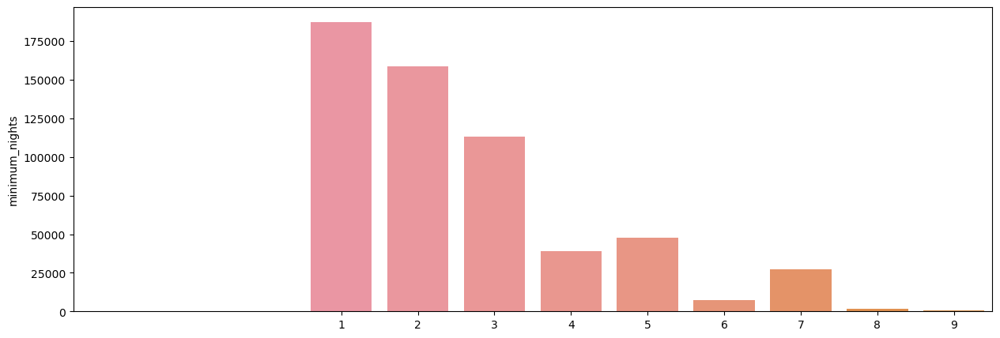

In [35]:
diagrama_caixa(base_airbnb_aj['minimum_nights'])
grafico_barra(base_airbnb_aj['minimum_nights'])

- Aqui temos um motivo talvez até mais forte para excluir esses outliers da análise.

- Estamos querendo um modelo que ajude a precificar apartamentos comuns como uma pessoa comum gostaria de disponibilizar. No caso, apartamentos com mais de 8 noites como o "mínimo de noites" podem ser apartamentos de temporada ou ainda apartamentos para morar, em que o host exige pelo menos 1 mês no apartamento.

- Por isso, vamos excluir os outliers dessa coluna

In [36]:
base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'minimum_nights')
print('{} linhas removidas'.format(linhas_removidas))

40383 linhas removidas


#### Coluna "maximum_nights"

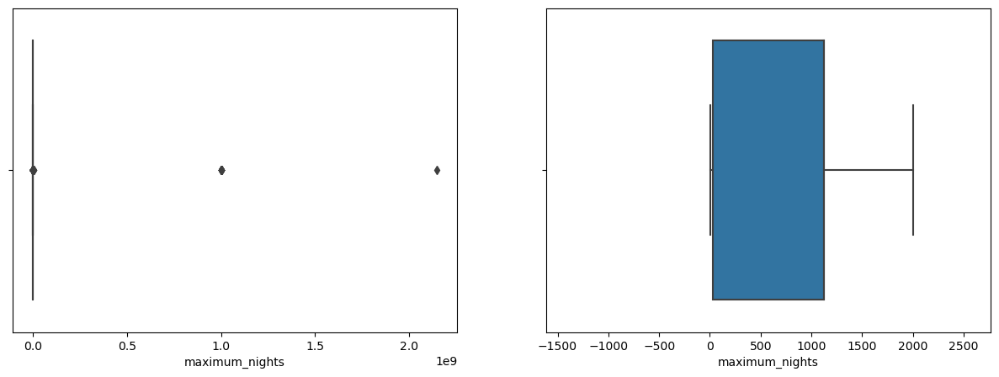

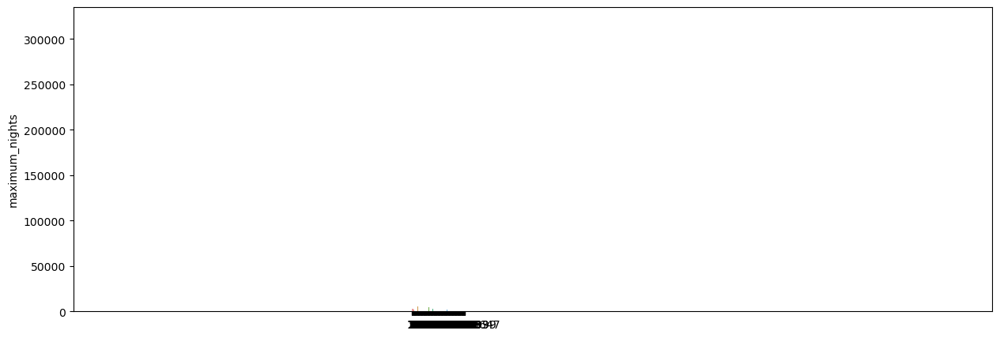

In [37]:
diagrama_caixa(base_airbnb_aj['maximum_nights'])
grafico_barra(base_airbnb_aj['maximum_nights'])

- Analisando os resultados do gráfico, pudemos perceber (além da dificuldade na leitura dos mesmos), que os valores dentro dos limites dessa coluna são extremamente variantes (de 0 a quase 2000 noites).

- Isso porque parece que quase todos os hosts não preenchem esse campo de maximum nights ou, quando preenchem, não parecem querer limitar à uma quantidade baixa, colocando valores bem altos para não ser uma barreira para os hóspedes que almejam ficar mais dias.

- Sendo assim, maximum nights não parece que vai ser um fator relevante para nosso modelo. Optamos, portanto, em excluir essa coluna da análise.

In [38]:
print(base_airbnb_aj.shape)
base_airbnb_aj = base_airbnb_aj.drop('maximum_nights', axis=1)
print(base_airbnb_aj.shape)

(581983, 22)
(581983, 21)


#### Coluna "number_of_reviews"

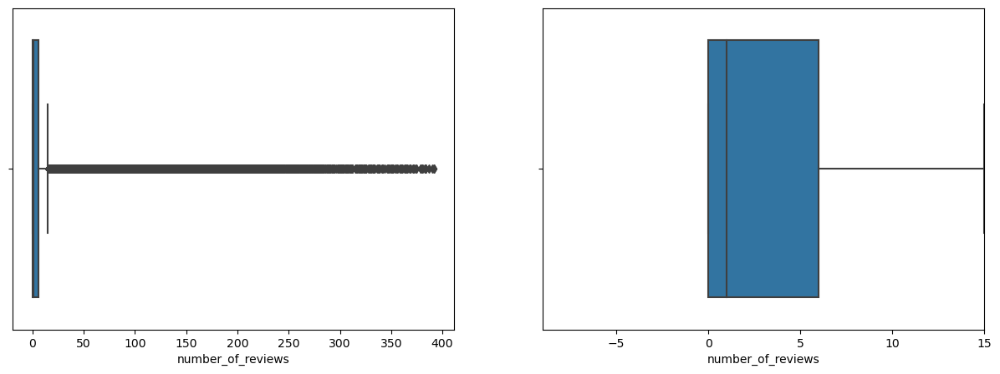

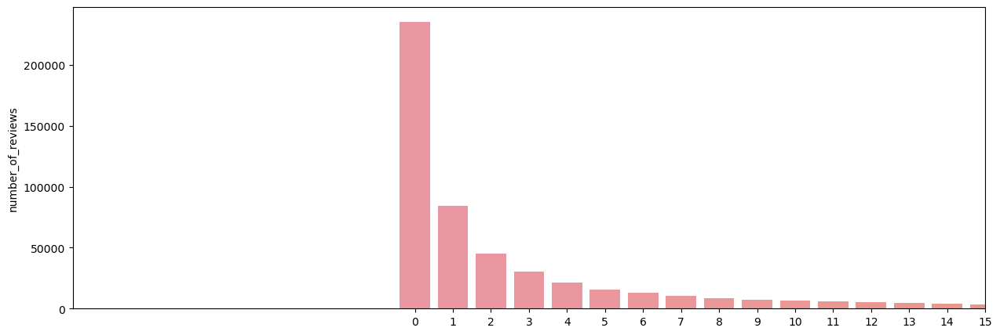

In [39]:
diagrama_caixa(base_airbnb_aj['number_of_reviews'])
grafico_barra(base_airbnb_aj['number_of_reviews'])

- Aqui poderíamos tomar algumas decisões diferentes. A abordagem escolhida foi baseada na análise pessoal deste analista e foi optar por tirar essa característica da análise, por alguns motivos:

    1. Se excluirmos os outliers, vamos excluir os hosts que tem a maior quantidade de reviews (o que normalmente são os hosts que têm mais aluguel). Isso pode impactar muito negativamente o nosso modelo, afinal, a tendência é que hosts que estão a mais tempo na plataforma possuam maior experiência e, consequentemente, maior precisão na precificação de seus aluguéis.
    2. Pensando no nosso objetivo, se eu tenho um imóvel parado e quero colocar meu imóvel na Airbnb para alugar, é esperado que eu não tenha review nenhuma. Então, tirar essa característica da análise poderia, provavelmente, ajudar o modelo de acordo com nosso objetivo (que pretende também ajudar esses hosts novos e sem reviews).
    3. Particularmente, é da opinião desse analista que essa característica (number_of_reviews) dificilmente deveria impactar ou não o preço final

In [40]:
# Sendo assim, vamos excluir a coluna da análise

print(base_airbnb_aj.shape)
base_airbnb_aj = base_airbnb_aj.drop('number_of_reviews', axis=1)
print(base_airbnb_aj.shape)

(581983, 21)
(581983, 20)


#### Tratamento de Colunas de Valores de Texto

- Colunas de texto não podem ser analisadas através de um boxplot.
- Vamos agrupá-las e considerá-las como categorias do nosso modelo

#### - Coluna "property_type"

Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                      34
Resort    

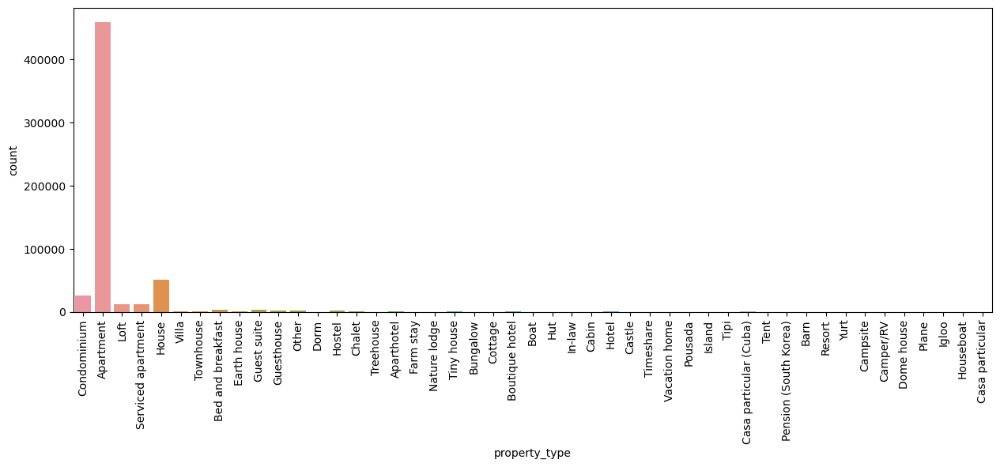

In [41]:
# Vamos avaliar quantos dados de cada tipo de imóvel existem em nosso modelo até aqui

print(base_airbnb_aj['property_type'].value_counts()) #printa a tabela que conta quantos dados existem para cada tipo existente em 'property_name'

# Vamos plotar um gráfico de barras para ficar mais visual
plt.figure(figsize=(15, 5)) #define a área do gráfico
grafico = sns.countplot(x=base_airbnb_aj['property_type']) #plota o gráfico, já realizando a contagem, igual fizemos na primeira linha dessa célula
grafico.tick_params(axis='x', rotation=90) #rotaciona os nomes no eixo X, para que a leitura do gráfico seja mais amigável

- Aqui nossa ação não é "excluir outliers", mas sim agrupar valores que são muito pequenos.

- Todos os tipos de propriedade que têm menos de 2.000 propriedades na base de dados, vamos agrupar em um grupo chamado "outros". Acreditamos que isso vai facilitar o nosso modelo e ainda manterá uma coerência com o objetivo.

- O valor de corte de 2000 foi definido por este analista, exclusivamente em prol da simplificação do modelo. A alteração deste valor poderá ser realizada conforme necessidade ou tomada de decisão futura.

['Other', 'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house', 'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)', 'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle', 'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV', 'Yurt', 'Tent', 'Tipi', 'Barn', 'Farm stay', 'Pension (South Korea)', 'Dome house', 'Igloo', 'In-law', 'Vacation home', 'Timeshare', 'Pousada', 'Houseboat', 'Casa particular', 'Plane']
Apartment             458354
House                  51387
Condominium            26456
Serviced apartment     12671
Loft                   12352
Outros                  8850
Guest suite             3621
Bed and breakfast       3472
Hostel                  2665
Guesthouse              2155
Name: property_type, dtype: int64


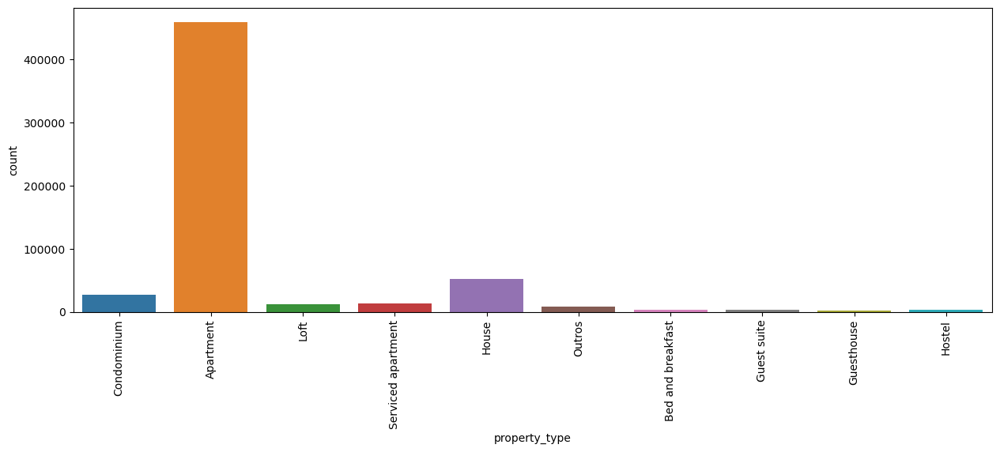

In [42]:
# Definido o valor de corte, vamos agrupar os valores conforme o critério:

VALOR_DE_CORTE = 2000 #definindo a constante que armazena o valor de corte

tabela_tipos_casa = base_airbnb_aj['property_type'].value_counts() #armazena a tabela contendo a contagem de dados para cada categoria (property_name)
colunas_agrupar = [] #cria uma lista vazia

for tipo in tabela_tipos_casa.index: #percorre a tabela de contagem baseado no índice da mesma (nome da categoria)
    if tabela_tipos_casa[tipo] < VALOR_DE_CORTE: #se a qtde de casas for maior que o valor de corte
        colunas_agrupar.append(tipo) #armazena o nome da categoria em questão dentro de uma lista
print(colunas_agrupar) #printa os nomes de todas as categorias que estão abaixo do valor de corte

for tipo in colunas_agrupar: #percorre a lista contendo o nome das caegorias abaixo do valor de corte
    base_airbnb_aj.loc[base_airbnb_aj['property_type']==tipo, 'property_type'] = 'Outros' #localiza todas as linhas da coluna
    #'property_name' que tenham o mesmo valor do tipo analisado. Lembre-se que o tipo analisado faz parte das categorias que
    #estão abaixo do valor de corte. Em seguida, atribui o valor de cada uma dessas linhas ao valor "Outros".

print(base_airbnb_aj['property_type'].value_counts()) #printa a nova tabela de contagem por categoria, agora com os valores "Outros" já agrupados

# Printa o gráfico novamente, com a categoria "Outros" ja agrupada
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=base_airbnb_aj['property_type'])
grafico.tick_params(axis='x', rotation=90)

#### - Coluna "room_type"

Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: room_type, dtype: int64


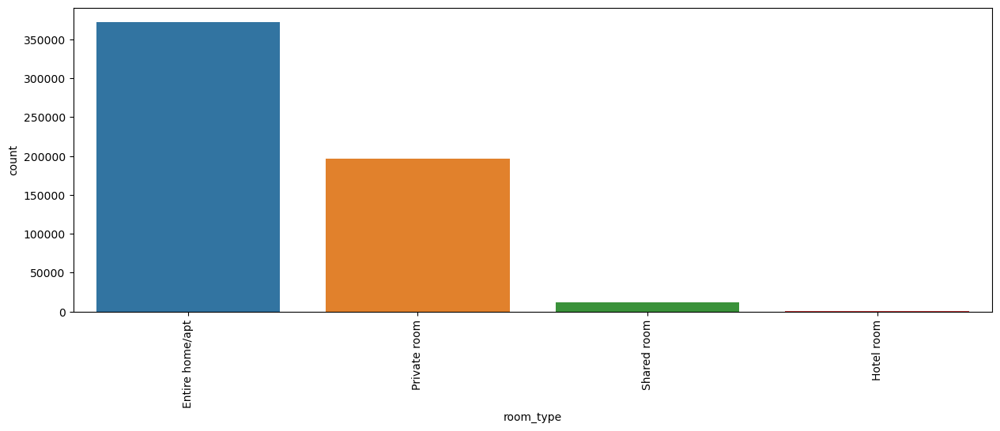

In [43]:
# Vamos avaliar quantos dados de cada tipo de quarto existem em nosso modelo até aqui

print(base_airbnb_aj['room_type'].value_counts()) #printa a tabela que conta quantos dados existem para cada tipo existente em 'room_type'

# Vamos plotar um gráfico de barras para ficar mais visual
plt.figure(figsize=(15, 5)) #define a área do gráfico
grafico = sns.countplot(x=base_airbnb_aj['room_type']) #plota o gráfico, já realizando a contagem, igual fizemos na primeira linha dessa célula
grafico.tick_params(axis='x', rotation=90) #rotaciona os nomes no eixo X, para que a leitura do gráfico seja mais amigável

Para tipos de quarto, os dados já parecem bem distribuídos. Não achamos a necessidade de realizar agrupamentos.

#### - Coluna "bed_type"

Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: bed_type, dtype: int64


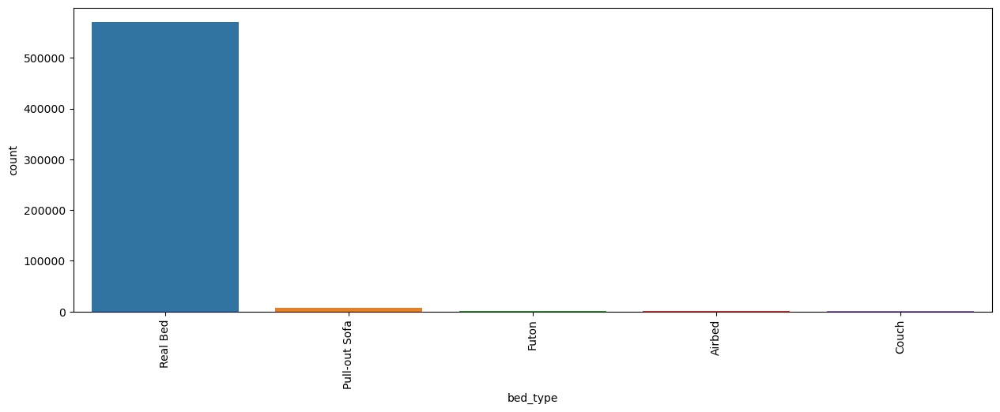

In [44]:
# Vamos avaliar quantos dados de cada tipo de quarto existem em nosso modelo até aqui

print(base_airbnb_aj['bed_type'].value_counts()) #printa a tabela que conta quantos dados existem para cada tipo existente em 'bed_type'

# Vamos plotar um gráfico de barras para ficar mais visual
plt.figure(figsize=(15, 5)) #define a área do gráfico
grafico = sns.countplot(x=base_airbnb_aj['bed_type']) #plota o gráfico, já realizando a contagem, igual fizemos na primeira linha dessa célula
grafico.tick_params(axis='x', rotation=90) #rotaciona os nomes no eixo X, para que a leitura do gráfico seja mais amigável

Como temos 1 valor claramente muito maior do que todos os outros, vamos criar apenas 2 grupos de camas: "Real Bed" e "outros". Isso vai simplificar o modelo.

['Pull-out Sofa', 'Futon', 'Airbed', 'Couch']
Real Bed    570643
Outros       11340
Name: bed_type, dtype: int64


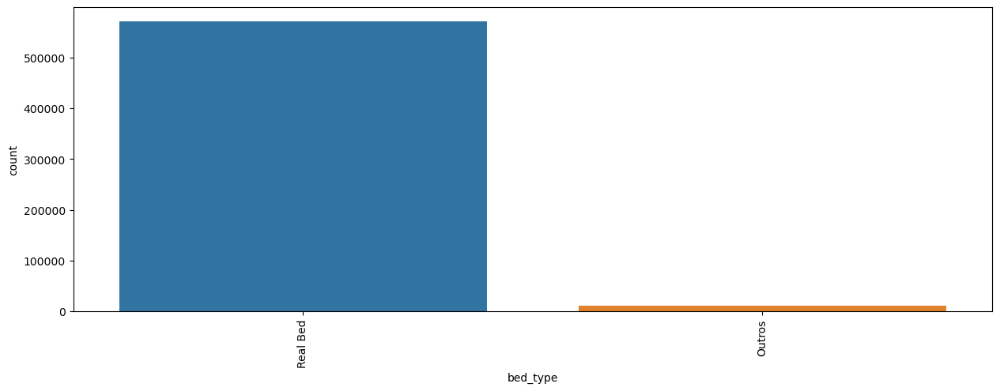

In [45]:
# Vamos agrupar os valores conforme o critério:

VALOR_DE_CORTE = 10000 #definindo a constante que armazena o valor de corte, de modo a ser maior que o valor de 'Pull-out Sofa', que é a maior entre as categorias que serão agrupadas

tabela_bed = base_airbnb_aj['bed_type'].value_counts() #armazena a tabela contendo a contagem de dados para cada categoria (bed_type)
colunas_agrupar = [] #cria uma lista vazia

for tipo in tabela_bed.index: #percorre a tabela de contagem baseado no índice da mesma (nome da categoria)
    if tabela_bed[tipo] < VALOR_DE_CORTE: #se a qtde de camas for maior que o valor de corte
        colunas_agrupar.append(tipo) #armazena o nome da categoria em questão dentro de uma lista
print(colunas_agrupar) #printa os nomes de todas as categorias que estão abaixo do valor de corte

for tipo in colunas_agrupar: #percorre a lista contendo o nome das caegorias abaixo do valor de corte
    base_airbnb_aj.loc[base_airbnb_aj['bed_type']==tipo, 'bed_type'] = 'Outros' #localiza todas as linhas da coluna
    #'bed_type' que tenham o mesmo valor do tipo analisado. Lembre-se que o tipo analisado faz parte das categorias que
    #estão abaixo do valor de corte. Em seguida, atribui o valor de cada uma dessas linhas ao valor "Outros".

print(base_airbnb_aj['bed_type'].value_counts()) #printa a nova tabela de contagem por categoria, agora com os valores "Outros" já agrupados

# Printa o gráfico novamente, com a categoria "Outros" ja agrupada
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=base_airbnb_aj['bed_type'])
grafico.tick_params(axis='x', rotation=90)

#### - Coluna "cancellation_policy"

flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: cancellation_policy, dtype: int64


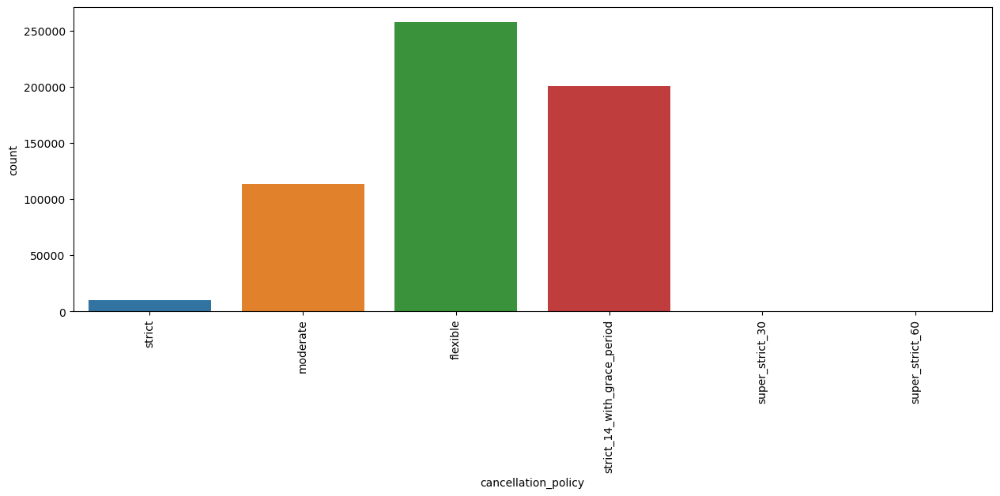

In [46]:
# Vamos avaliar quantos dados de cada tipo de política de cancelamento existem em nosso modelo até aqui

print(base_airbnb_aj['cancellation_policy'].value_counts()) #printa a tabela que conta quantos dados existem para cada tipo existente em 'cancellation_policy'

# Vamos plotar um gráfico de barras para ficar mais visual
plt.figure(figsize=(15, 5)) #define a área do gráfico
grafico = sns.countplot(x=base_airbnb_aj['cancellation_policy']) #plota o gráfico, já realizando a contagem, igual fizemos na primeira linha dessa célula
grafico.tick_params(axis='x', rotation=90) #rotaciona os nomes no eixo X, para que a leitura do gráfico seja mais amigável

- Vamos agrupar em um grupo chamado "strict" todas as categorias que possuam esse nome, exceto "strict_14_with_grace_period", por ser uma categoria com uma quantidade bastante considerável ante as demais.
- Para tal, vamos definir um valor de corte sendo 10.000, que é um valor maior que a quantidade de dados da maior categoria entre aqueles que serão agrupadas ("strict", que contém 9696 dados)
- Acreditamos que isso vai facilitar o nosso modelo e ainda manterá uma coerência com o objetivo.

['strict', 'super_strict_60', 'super_strict_30']
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: cancellation_policy, dtype: int64


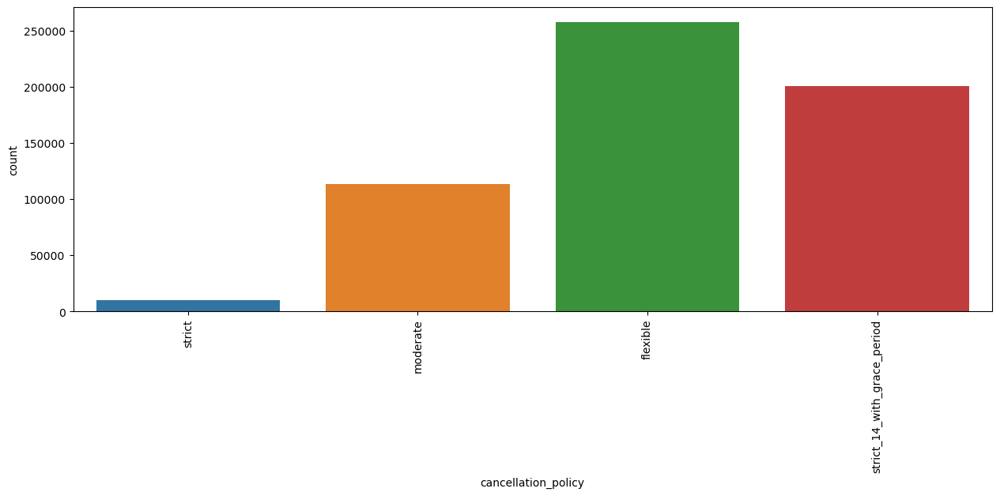

In [47]:
# Vamos agrupar os valores conforme o critério:

VALOR_DE_CORTE = 10000 #definindo a constante que armazena o valor de corte

tabela_cancellation = base_airbnb_aj['cancellation_policy'].value_counts() #armazena a tabela contendo a contagem de dados para cada categoria (cancellation_policy)
colunas_agrupar = [] #cria uma lista vazia

for tipo in tabela_cancellation.index: #percorre a tabela de contagem baseado no índice da mesma (nome da categoria)
    if tabela_cancellation[tipo] < VALOR_DE_CORTE: #se a qtde de dados for maior que o valor de corte
        colunas_agrupar.append(tipo) #armazena o nome da categoria em questão dentro de uma lista
print(colunas_agrupar) #printa os nomes de todas as categorias que estão abaixo do valor de corte

for tipo in colunas_agrupar: #percorre a lista contendo o nome das caegorias abaixo do valor de corte
    base_airbnb_aj.loc[base_airbnb_aj['cancellation_policy']==tipo, 'cancellation_policy'] = 'strict' #localiza todas as linhas da coluna
    #'cancellation_policy' que tenham o mesmo valor do tipo analisado. Lembre-se que o tipo analisado faz parte das categorias que
    #estão abaixo do valor de corte. Em seguida, atribui o valor de cada uma dessas linhas ao valor "strict".

print(base_airbnb_aj['cancellation_policy'].value_counts()) #printa a nova tabela de contagem por categoria, agora com os valores "strict" já agrupados

# Printa o gráfico novamente, com a categoria "Outros" ja agrupada
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=base_airbnb_aj['cancellation_policy'])
grafico.tick_params(axis='x', rotation=90)

#### - Coluna "amenities"

In [48]:
# Vamos avaliar duas linhas quaisquer da coluna 'amenities':

print(base_airbnb_aj['amenities'].iloc[0]) #printa os valores contidos na linha de índice 0
print("\n")
print(base_airbnb_aj['amenities'].iloc[1]) #printa os valores contidos na linha de índice 1
print("\n")

{TV,"Cable TV",Internet,Wifi,"Air conditioning",Kitchen,"Paid parking off premises","Smoking allowed",Doorman,Elevator,"Hot tub","Family/kid friendly","Suitable for events",Essentials,"24-hour check-in",Hangers,"Hair dryer",Iron,"Laptop friendly workspace","Self check-in","Front desk/doorperson","Private entrance","Hot water","Bed linens","Luggage dropoff allowed"}


{TV,"Cable TV",Internet,Wifi,"Air conditioning",Kitchen,Doorman,Elevator,"Buzzer/wireless intercom","Family/kid friendly",Hangers,"Hair dryer",Iron,"Laptop friendly workspace"}




- Como temos uma diversidade muito grande de amenities (comodidades) e, às vezes, as mesmas amenities podem ser escritas de forma diferente (pois depende do input do usuário), vamos avaliar a quantidade de amenities como o parâmetro para o nosso modelo, isto é, vamos trasformar esta feature de um valor de texto para um valor numérico.
- Consideramos esta simplificação como razoável, pois mesmo que o conteúdo do dado seja de baixa qualidade, a quantidade de preenchimentos pode indicar características como um host mais cuidadoso com o preenchimento ou simplesmente uma casa que possua mais comodidades de fato, o que, no nosso entendimento, poderia/deveria impactar no preço de um imóvel.

In [49]:
# Podemos perceber que os dados de amenities são um conjunto de textos separados por ','. portanto, podemos separar esse textos
# em uma lista de strings:

print(base_airbnb_aj['amenities'].iloc[1].split(',')) #printa os valores contidos na linha de índice 1, separados por ','
print("\n")

# Agora que temos uma lista de textos separados, podemos contar a quantidade de textos (amenities) existem para essa linha de
# índice 1:

print(len(base_airbnb_aj['amenities'].iloc[1].split(',')))

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', 'Doorman', 'Elevator', '"Buzzer/wireless intercom"', '"Family/kid friendly"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"}']


14


Agora que definimos o algoritmo de transformação da coluna 'amenities' de um valor textual para um valor numérico, vamos aplicar à nossa base de dados, acrescentando uma coluna que armazenará a quantidade de amenities para cada linha. Vamos chamar essa coluna de 'n_amenities':

In [50]:
base_airbnb_aj['n_amenities'] = base_airbnb_aj['amenities'].str.split(',').apply(len)

Criada a coluna 'n_amenities", já podemos excluir a coluna "amenities" do nosso modelo, pois já não terá mais utilidade para nós

In [51]:
print(base_airbnb_aj.shape) #conferindo quantas colunas existiam antes da exclusão
base_airbnb_aj = base_airbnb_aj.drop('amenities', axis=1) #excluindo a coluna "amenities"
print(base_airbnb_aj.shape) #confirmando que a qtde de colunas, de fato, diminuiu

(581983, 21)
(581983, 20)


Então, essa virou uma coluna de valor numérico e, como todas as outras colunas de valores numéricos, vamos analisar e excluir outliers (caso essa seja nossa conclusão), igual fizemos com as colunas numéricas anteriores.

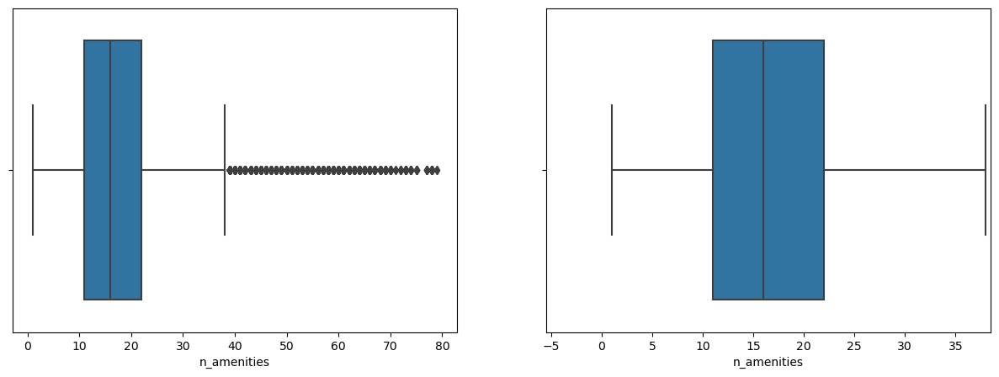

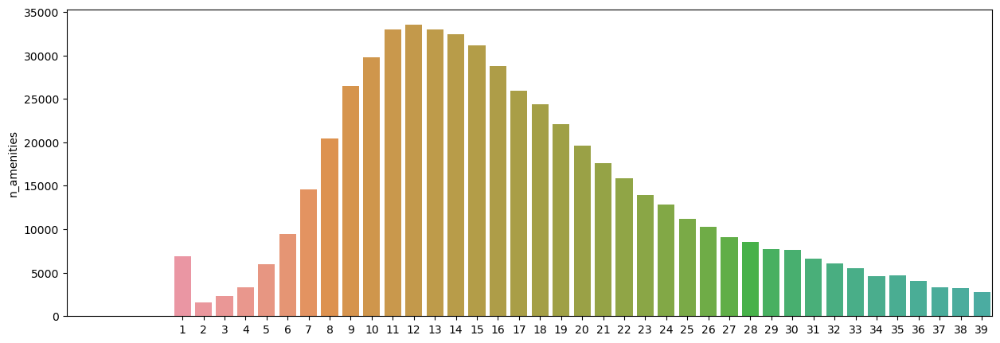

In [52]:
diagrama_caixa(base_airbnb_aj['n_amenities'])
grafico_barra(base_airbnb_aj['n_amenities'])

Após análise, podemos concluir que, de fato, excluir os outliers parece fazer sentido, afinal, imóveis com mais de 40 amenities registradas pode indicar imóveis de padrão muito elevado, que foge do escopo do projeto.

In [53]:
# Sendo assim, vamos excluir os outliers

base_airbnb_aj, linhas_removidas = excluir_outliers(base_airbnb_aj, 'n_amenities')
print('{} linhas removidas'.format(linhas_removidas))

24343 linhas removidas


### Visualização do mapa das propriedades

- Vamos criar um mapa que exibe um pedaço arbitrário da nossa base de dados (50.000 propriedades) para ver como as propriedades estão distribuídas pela cidade e também identificar os locais de maior preço.
- Utilizar a base toda pode poluir o mapa e dificultar a leitura e interpretação dos dados.

In [54]:
amostra = base_airbnb_aj.sample(n=50000) #define o tamanho da amostra em 50 mil

centro_mapa = {'lat':amostra.latitude.mean(), 'lon':amostra.longitude.mean()} #define o centro do mapa sendo a média de latitude/longitude considerando todos os dados da amostra
# Lembrando que escrever:
    # amostra.latitude.mean()
    # tem o mesmo valor de sintaze que:
    # amostra['latitude'].mean()

# O bloco abaixo configura todos os parâmetros do mapa gráfico que queremos plotar
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude',z='price', radius=2.5,
                        center=centro_mapa, zoom=10,
                        mapbox_style='stamen-terrain')

# z -> define em qual coluna o gráfico deve se basear para definir a cor da bolha (ponto)
# radius -> define o tamanho do raio da bolha
# center -> define onde o gráfico deve definir o centro na hora de plotar
# zoom -> define a quantidade de zoom aplicado por padrão
# mapbox_style -> define o estilo de gráfico (para descobrir mais estilos, vide referência bibliográfica)


mapa.show() #plota o gráfico

Algumas observações que podemos tirar deste gráfico:

- A princípio, parece que a localização será um fator relevante para o nosso modelo precificar os valores dos imóveis, pois é possível perceber uma clara tendência de preços mais altos em determinadas regiões da cidade do Rio de Janeiro do que em outras
- Por exemplo, toda a região sul da cidade, conhecida por ser uma das mais visitadas e atrativas, apresenta uma grande concentração de imóveis de preço mais elevado (pontos amarelos), o que é intuitivo concluir, afinal as regiões que possuem a maior demanda, por lógica de mercado, deveriam ser aquelas com os preços mais elevados.
- Da mesma maneira, regiões menos turísticas tendem a ter preços mais acessíveis, dada a demanda reduzida.
- Sendo assim, podemos concluir que a melhor decisão é de manter os dados de localização no nosso modelo. Parece ser uma feature bastante relevante dentro da lógica de precificação.

### Encoding

Precisamor Ajustar as features para facilitar o trabalho do modelo futuro (features de categoria, true e false, etc.). Isto porque modelos matemáticos só conseguem trabalhar de forma satisfatória quando interpretam dados numéricos. Sendo assim, a estratégia, para nosso projeto será:

- Para features de valores True ou False, vamos substituir True por 1 e False por 0.
- Para features de Categoria (features em que os valores da coluna são textos) vamos utilizar o método de encoding de variáveis dummies
    - Para mais informações sobre essa técnica, consulte as referências bibliográficas

In [55]:
# Coluna True/False

colunas_tf = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready'] #armazena o nome das colunas que são do tipo T/F
base_airbnb_cod = base_airbnb_aj.copy() #para não modificar a base ajustada, vamos criar uma cópia do df (cod vem de "codificado")
for coluna in colunas_tf: #vamos percorrer a lista de nomes de colunas T/F
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='t', coluna] = 1 #onde o dado estava como 't' (de True), substituímos por 1
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='f', coluna] = 0 #onde o dado estava como 'f' (de False), substituímos por 0

In [56]:
# Colunas de Categoria (texto)

colunas_categorias = ['property_type', 'room_type', 'bed_type', 'cancellation_policy'] #armazena o nome das colunas que são do tipo texto
base_airbnb_cod = pd.get_dummies(data=base_airbnb_cod, columns=colunas_categorias, dtype=int) #vide explicação ao final da célula

display(base_airbnb_cod.head()) #apenas para visualizar a tabela e confirmar que as novas colunas foram adicionadas

# O método do Pandas '.get_dummies' já realiza o trabalho de transformar as colunas passadas como parâmetro para a codificação
# em variáveis dummies, bastando passar o nome do dataframe e os nomes das colunas a serem codificadas.
# MAS ATENÇÃO!!! É importante, também, passar o praâmetro "dtype=int" para que o Pandas preencha as variáveis com valores numéricos
# (0 e 1), caso contrário, ele preencherá com True/False.

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,extra_people,...,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_Outros,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period
1,1,2.0,-22.965919,-43.178962,5,1.0,2.0,2.0,270.0,51.0,...,1,0,0,0,0,1,0,0,1,0
3,0,3.0,-22.977117,-43.190454,3,1.0,1.0,2.0,161.0,45.0,...,1,0,0,0,0,1,0,0,1,0
4,1,1.0,-22.983024,-43.214270,3,1.0,1.0,2.0,222.0,68.0,...,1,0,0,0,0,1,0,0,1,0
5,1,1.0,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,86.0,...,1,0,0,0,0,1,0,0,1,0
6,1,1.0,-22.981269,-43.190457,2,1.0,1.0,2.0,219.0,80.0,...,1,0,0,0,0,1,0,0,1,0


## Modelo de Previsão

Para definir nosso modelo de previsão, vamos passar por algumas etapas:

1. Definir entre um modelo de regressão ou classificação
2. Definir as métricas de avaliação dos modelos
3. Definir quais modelos vamos usar e testar
4. Treinar e testar todos os modelos
5. Comparar os modelos e escolher o melhor
6. Entender como o melhor modelo funciona
7. Ajustar e otimizar o melhor modelo

##### Obs: Os 7 passos para definir um modelo de previsão tiveram como referência os materiais didáticos disponibilizados pelos responsáveis do curso Python Impressionador da instituição Hashtag Treinamentos.

### 1. Regressão ou classificação?

De antemão, podemos concluir que temos um modelo de <b>regressão</b> para este projeto, pois nosso objetivo é chegar a um <b>número</b> ótimo que prevê o preço ideal de aluguel para um imóvel comum dentro da plataforma Airbnb. Assim sendo, esta etapa já está finalizada.

### 2. Métricas de avaliação

Vamos usar aqui o R² que vai nos dizer o quão bem o nosso modelo consegue explicar o preço. Isso seria um ótimo parâmetro para avaliar a precisão do nosso modelo <br>
    => Quanto mais próximo de 100%, melhor.

Vamos calcular também o Erro Quadrático Médio, que vai mostrar para gente o quanto o nosso modelo está errando. <br>
    => Quanto menor for o erro, melhor.

In [57]:
# Vamos definir uma função que realizará os procedimentos para avaliar um modelo

def avaliar_modelo(nome_modelo, y_teste, previsao):
    '''Função que calcula o R² e a raiz do Erro Quadrático Médio (RSME) de um modelo'''
    r2 = r2_score(y_teste, previsao) #calcula o R², utilizando a função 'r2_score' da biblioteca 'sklearn.metrics'
    RSME = np.sqrt(mean_squared_error(y_teste, previsao)) #calcula a raiz (utilizando a biblioteca numpy) do RSME, utilizando a função 'mean_squared_error' da biblioteca 'sklearn.metrics'
    return f'Modelo {nome_modelo}:\nR²:{r2:.2%}\nRSME:{RSME:.2f}' #retorna uma string contendo os valores de interesse


# Repare que:
# 
# y_teste = É o conjunto de dados que serão utilizados para testar o modelo, isto é, uma parcela da base de dados que é separada
# para verificar se o modelo de previsão está assertivo (um conceito básico de Machine Learning)

### 3. Escolha dos Modelos a Serem Testados

Foram escolhidos 3 modelos diferentes para serem testados:

    1. RandomForest
    2. LinearRegression
    3. Extra Tree
    
Esses são alguns dos modelos que existem para fazer previsão de valores numéricos (o que chamamos de regressão). Estamos querendo calcular o preço, portanto, queremos prever um valor numérico (modelo de regressão, conforme definido na primeira etapa). Existem dezenas, ou até centenas de modelos diferentes, porém esses 3 que usamos aqui são bastante empregados para muitos problemas de regressão como esse que temos aqui e, portanto, são escolhas razoáveis.

In [58]:
# Definindo os modelos

modelo_rf = RandomForestRegressor() #criando uma instância do modelo Random Forest (utilizando a biblioteca 'sklearn.ensemble')
modelo_lr = LinearRegression() #criando uma instância do modelo Linear Regression (utilizando a biblioteca 'sklearn.linear_model')
modelo_et = ExtraTreesRegressor() #criando uma instância do modelo Extra Tree (utilizando a biblioteca 'sklearn.ensemble')

# Armazena as instâncias num dicionário, onde as chaves são os nomes dos modelos
modelos = {'RandomForest': modelo_rf,
          'LinearRegression': modelo_lr,
          'ExtraTrees': modelo_et,
          }

# Separa a base de dados
y = base_airbnb_cod['price'] #separa apenas as variáveis que desejamos calcular/prever (a coluna de preço dos imóveis) 
X = base_airbnb_cod.drop('price', axis=1) #separa apenas as features do modelo (todas as demais colunas que serão utilizadas pelo modelo para prever o preço)

### 4. Treinar e testar os modelos

Nesta etapa, separamos os dados em treino e teste. Essa etapa é crucial, pois é com o treino (train) que as Inteligências Artificiais "aprendem" a prever resultados.

A técnica consiste em, basicamente: separar as informações em treino e teste. Ex: 10% da base de dados vai servir para teste e 90% para treino (normalmente a base de treino é maior mesmo).

Em seguida, damos para o modelo os dados de treino. Ele vai analisar aqueles dados e "aprender" a prever os preços.

Depois que ele aprende, fazemos um teste com o modelo, com os dados de teste, para ver se sua assertividade está boa ou não. Analisando os dados de teste, vamos descobrir o melhor modelo para a nossa solução.

In [59]:
# Nesta célula, vamos separar as bases, treinar e testar o modelo

# Utilizamos a função 'train_test_split' da biblioteca 'sklearn.model_selection' que facilmente realiza esta separação da base.
# Vamos utilizar um random_state=10 como a seed padrão.
# Como não vamos passar o argumento 'test_size' para a função, por padrão, ela considerará 0.25 (25% da base será reservada para teste, enquanto os outros 75% serão usados para o treino)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

# O bloco seguinte realiza o treino e o teste dos modelos. Adicionalmente, vamos contabilizar o tempo que cada modelo levou para
# executar as tarefas, pois é informação relevante na hora da tomada de decisão entre qual o melhor modelo disponível
for nome_modelo, modelo in modelos.items(): #percorre o dicionário onde estão armazenados os modelos escolhidos para teste
    
    t2 = time.time() # Para iniciar a contagem de tempo que levará para rodar os modelos de Machine Learning.
    
    #treinar
    modelo.fit(X_train, y_train) #função que treina(train) a base de dados, parametrizada pelos dados separados para treino ('X_train' e 'y_train')
    
    #testar
    previsao = modelo.predict(X_test) #função que retorna a previsão do modelo
    print(avaliar_modelo(nome_modelo, y_test, previsao)) #printa o retorno da função criada na etapa 2, responsável por demonstrar os resultados obtidos pelo modelo
    
    #bloco para calcular e printar o tempo de execução do modelo
    t_hora = (time.time() - t2)//3600      # pega apenas a parte inteira da divisão
    t_minutos = ((time.time() - t2)//60)  
    t_segundos = (time.time() - t2)

    if t_minutos >= 60:
        t_minutos = ((time.time() - t2)//60) - t_hora*60  # Menos t_hora*60, pois, após 59 minutos, já acrescentou um hora
    if t_segundos >= 60 and t_segundos < 3600:
                  t_segundos = ((time.time() - t2) - t_minutos*60) //1  #total de segundos, menos os minutos.
    elif t_segundos >= 3600:
                  t_segundos = ((time.time() - t2) - t_hora*3600 - t_minutos*60) //1  #total de segundos, menos horas e minutos.

    print(f'\nO Tempo total de execução foi de: {t_hora:.0f}h {t_minutos:.0f}min {t_segundos:.0f}s')
    print('\n')

Modelo RandomForest:
R²:97.24%
RSME:44.06

O Tempo total de execução foi de: 0h 4min 1s


Modelo LinearRegression:
R²:32.70%
RSME:217.54

O Tempo total de execução foi de: 0h 0min 1s


Modelo ExtraTrees:
R²:97.50%
RSME:41.91

O Tempo total de execução foi de: 0h 3min 37s




### 5. Definir o Melhor Modelo

- <b>Melhor Modelo:</b> ExtraTressRegressor

    Para nós, esse foi o modelo considerado o melhor, pois foi aquele com o maior valor de R², o menor valor de RSME e o menor tempo de execução, ou seja, foi o modelo com as melhores performances nas 3 métricas que definimos para avaliar.
    Como não tivemos uma grande diferença de velocidade de treino e de previsão desse modelo com o modelo de RandomForest (que teve resultados próximos de R² e RSME), vamos escolher o Modelo ExtraTrees.
    Caso o tempo de execução fosse muito maior para ExtraTrees, o melhor modelo poderia ser o RandomForest sem problemas, dada a quase desprezível diferença entre os dois modelos nas demais métricas.    
    O modelo de regressão linear não obteve um resultado satisfatório, com valores de R² e RSME muito piores do que os outros 2 modelos.
    <br>
    
- Resultados das Métricas de Avaliação no Modelo Vencedor:
<br>
Modelo ExtraTrees:<br>
R²: 97.50%<br>
RSME: 41.92<br>
Tempo total de execução: 0h 4min 50s

### 6. Entendendo como o melhor modelo funciona

,0
bedrooms,0.115459
latitude,0.104014
longitude,0.100720
n_amenities,0.088798
extra_people,0.086553
accommodates,0.073079
bathrooms,0.070544
minimum_nights,0.065417
room_type_Entire home/apt,0.063593
beds,0.052886


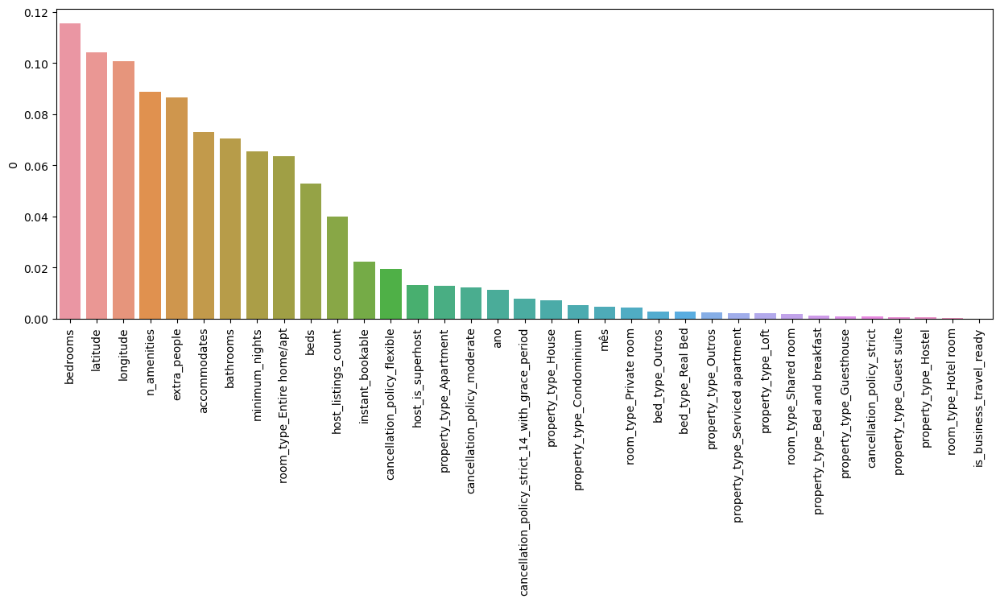

In [60]:
# Utilizando o método 'feature_importances_' da biblioteca 'sklearn', vamos descobrir qual o grau de importância que cada uma
# das features tem no nosso modelo final, ou seja, quanto cada uma das variáveis (colunas) influencia na hora do modelo prever
# o preço de um imovel

importancia_features = pd.DataFrame(modelo_et.feature_importances_, X_train.columns) #cria um df cujo índice são os títulos das colunas do nosso df de treino (X_train.columns) e os valores são o número de importância associada à ela (modelo_et.feature_importances_)
importancia_features = importancia_features.sort_values(by=0, ascending=False) #ordena o df em ordem decrescente
display(importancia_features) #printa a tabela na tela

# Vamos visualizar a tabela criada acima em formato de gráfico de barras
plt.figure(figsize=(15, 5))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis='x', rotation=90)

#### Principais pontos de destaque analisados:

- A quantidade de quartos (bedrooms) foi a feature que mais influenciou nosso modelo, o que faz sentido se pensarmos que é uma característica importante para definir o porte do imóvel alugado, isto é, quanto mais quartos, a tendência é que o imóvel seja maior e, consequentemente, mais caro.
- Latitude e longitude, conforme previsto por nossas expectativas iniciais, possuem alta importância para o modelo, indicando que a localização de um imóvel é fundamental na hora de um host definir seu preço, afinal é intuitivo prever que imóveis bem localizados (próximo a comércios, pontos turísticos, praias, centros, parques, etc) sejam economicamente mais valorizados que imóveis localizados em pontos de menor interesse.
- A quantidade de comodidades (n_amenities) permite dois viéses de interpretações:
    1. De fato, um imóvel que possui muitas comodidades registradas no anúncio podem indicar um imóvel mais equipado, com mais conforto e, consequentemente, pode cobrar um pouco a mais por isso.
    2. Anuncios com uma reduzida quantidade de comodidades registradas podem indicar um host que não se preocupa em registrar todas as qualidades da casa, isto é, não trabalha corretamente a imagem do imóvel no anuncio e, consequentemente, acaba reduzindo o valor do aluguel para chamar a atenção dos locadores através do preço (o atrataivo do imóvel fica por conta do preço e não das qualidades da casa).
- O tipo de cama (bed_type) teve pouca importância, segundo o modelo. Uma provável explicação para isso é que, como são muito raros os imóveis que anunciam um tipo de cama diferente da cama comum (Real_bed), trata-se de uma comodidade considerada básica e que, provavelmente, poucos são os hosts que anunciam imóveis sem esse recurso. Aqueles que anunciam, provavelmente possuem imóveis menos tradicionais, como bangalôs, cabanas e etc, onde essa exigência não costuma ser tão rígida pelos locadores e o preço associado a esses imóveis está mais relacionado a outros tipos de experiências.
- Contrariando as expectativas iniciais, as features 'ano' e 'mês' não tiveram tanta influência no preço quanto o esperado. Apesar de não serem desprezíveis, o modelo demonstrou que existem features mais relevantes (por exemplo, o fato do host ser um "superhost") para a definição de preços altos do que períodos de alta temporada.
    - Uma hipótese que explicaria esse fenômeno seria o fato de que a cidade do Rio de Janeiro é um pólo turístico mundial já há muitos anos, ou seja, apesar da procura de imóveis para alugar, provavelmente, deva aumentar no verão, ela já possui uma demanda turística consolidada que permite os locatários manterem seus preços ao longo do ano todo.

### 7. Ajustes e Melhorias no Melhor Modelo

- is_business_travel_ready não demonstrou ter muito impacto no nosso modelo (importancia de 0,0000). Por isso, para chegar em um modelo mais simples (o que é sempre recomendado), vamos excluir essa feature e testar o modelo sem ela.

In [61]:
base_airbnb_cod = base_airbnb_cod.drop('is_business_travel_ready', axis=1)

y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10) #dividindo a base de dados

t2 = time.time() # Para iniciar a contagem de tempo que levará para rodar o modelo de Machine Learning.

modelo_et.fit(X_train, y_train) #treinando o modelo (dessa vez, apenas o modelo vencedor)
previsao = modelo_et.predict(X_test) #definindo a previsão
print(avaliar_modelo('ExtraTrees', y_test, previsao)) #printando os resultados do teste

#bloco para calcular e printar o tempo de execução do modelo
t_hora = (time.time() - t2)//3600      # pega apenas a parte inteira da divisão
t_minutos = ((time.time() - t2)//60)  
t_segundos = (time.time() - t2)

if t_minutos >= 60:
    t_minutos = ((time.time() - t2)//60) - t_hora*60  # Menos t_hora*60, pois, após 59 minutos, já acrescentou um hora
if t_segundos >= 60 and t_segundos < 3600:
              t_segundos = ((time.time() - t2) - t_minutos*60) //1  #total de segundos, menos os minutos.
elif t_segundos >= 3600:
              t_segundos = ((time.time() - t2) - t_hora*3600 - t_minutos*60) //1  #total de segundos, menos horas e minutos.

print(f'\nO Tempo total de execução foi de: {t_hora:.0f}h {t_minutos:.0f}min {t_segundos:.0f}s')

Modelo ExtraTrees:
R²:97.52%
RSME:41.75

O Tempo total de execução foi de: 0h 3min 30s


Podemos observar que os resultados obtidos após a exclusão da feature "is_business_travel_ready" foram praticamente idênticos aos resultados anteriores, portanto, é razoável manter essa exclusão. Lembre-se que quanto mais simples for o modelo, maior sua eficiência e velocidade de processamento e, consequentemente, é considerado um modelo melhor.

#### Teste de melhoria no modelo

Neste momento, é da opinião deste analista que o modelo já atinge os objetivos principais do projeto. No entanto, a título de curiosidade, vamos realizar um único teste retirando as colunas de 'bed_type', para verificar qual seria o comportamento e as métricas do modelo com essa alteração. Caso não haja qualquer alteração significativa nas métricas do novo modelo, podemos concluir que o modelo ainda pode ser otimizado, retirando algumas features menos influentes.

In [62]:
base_teste = base_airbnb_cod.copy() #criando uma cópia da base, para não alterar a base codificada original

for coluna in base_teste: #percorre todas as colunas da 'base_teste'
    if 'bed_type' in coluna: #se a coluna possuir 'bed_type' em seu nome
        base_teste = base_teste.drop(coluna, axis=1) #remove a coluna da base de dados (base_teste)
        
print(base_teste.columns, '\n\n') #confere que as colunas foram de fato retiradas

y = base_teste['price']
X = base_teste.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10) #dividindo a base de dados

t2 = time.time() # Para iniciar a contagem de tempo que levará para rodar o modelo de Machine Learning.

modelo_et.fit(X_train, y_train) #treinando o modelo
previsao = modelo_et.predict(X_test) #definindo a previsão
print(avaliar_modelo('ExtraTrees', y_test, previsao)) #printando os resultados do teste

#bloco para calcular e printar o tempo de execução do modelo
t_hora = (time.time() - t2)//3600      # pega apenas a parte inteira da divisão
t_minutos = ((time.time() - t2)//60)  
t_segundos = (time.time() - t2)

if t_minutos >= 60:
    t_minutos = ((time.time() - t2)//60) - t_hora*60  # Menos t_hora*60, pois, após 59 minutos, já acrescentou um hora
if t_segundos >= 60 and t_segundos < 3600:
              t_segundos = ((time.time() - t2) - t_minutos*60) //1  #total de segundos, menos os minutos.
elif t_segundos >= 3600:
              t_segundos = ((time.time() - t2) - t_hora*3600 - t_minutos*60) //1  #total de segundos, menos horas e minutos.

print(f'\nO Tempo total de execução foi de: {t_hora:.0f}h {t_minutos:.0f}min {t_segundos:.0f}s')

Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price',
       'extra_people', 'minimum_nights', 'instant_bookable', 'ano', 'mês',
       'n_amenities', 'property_type_Apartment',
       'property_type_Bed and breakfast', 'property_type_Condominium',
       'property_type_Guest suite', 'property_type_Guesthouse',
       'property_type_Hostel', 'property_type_House', 'property_type_Loft',
       'property_type_Outros', 'property_type_Serviced apartment',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room',
       'cancellation_policy_flexible', 'cancellation_policy_moderate',
       'cancellation_policy_strict',
       'cancellation_policy_strict_14_with_grace_period'],
      dtype='object') 


Modelo ExtraTrees:
R²:97.49%
RSME:42.02

O Tempo total de execução foi de: 0h 3min 31s


- Os resultados do teste demonstram que, apesar de serem praticamente desprezíveis, todas as métricas tiveram melhoras, ou seja, excluir as colunas de "bed_type" é uma decisão favorável ao modelo.
- Conforme já explicado, consideramos que o modelo, atualmente, já é satisfatório para nosso objetivo de projeto. As alterações realizadas no teste, portanto, pouco contribuirão para uma melhoria significativa, tanto em performance quanto em capacidade de previsão.
- Cabe registrar, no entanto, que este teste indica que o modelo ainda tem bastante espaço para otimizações, caso seja de interesse futuro, dada a alta quantidade de features com grau baixo de importância e que, potencialmente, podem ser excluídas ou agrupadas para um melhor desempenho e eficiência do modelo.

## Deploy do projeto

- Agora que temos nosso modelo treinado e otimizado, queremos disponibilizá-lo de modo mais amigável ao usuário.
- Sendo assim, vamos optar por realizar o deploy do projeto utilizando algumas bibliotecas auxiliares.
- Esta etapa do projeto será realizada em 6 passos:
    1. Criar arquivo do Modelo
    2. Escolher a forma de deploy
    3. Criar outro arquivo Python para armazenar o código de deploy
    4. Desenvolver o código de deploy no novo arquivo
    5. Atribuir ao botão o carregamento do modelo
    6. Realizar o deploy

#### 1. Criar arquivo do Modelo

- Vamos utilizar a biblioteca "joblib", que permite armazenar qualquer objeto Python em um arquivo acessível por qualquer outro programa Python (nosso arquivo de deploy, por exemplo).
- Neste caso, vamos armazenar o próprio modelo treinado (variável 'modelo_et')
- Mas antes, vamos salvar o arquivo que contém todos os dados já tratados para um arquivo .csv:

In [63]:
X['price'] = y #acrescenta a coluna 'price' novamente ao dataframe
X.to_csv('dados.csv') #salva o dataframe no arquivo 'dados.csv'

In [64]:
import joblib #importa a biblioteca que vamos utilizar para criar o arquivo utilizável por nosso arquivo de deploy

joblib.dump(modelo_et, 'modelo.joblib') #utilizando o método '.dump' para salvar o objeto 'modelo_et' num arquivo chamado "modelo.joblib"

# Vale notar que escolhemos o nome da extensão do arquivo como '.joblib' como boas práticas de padronização de nomenclatura, de
# modo que naturalmente seja possível concluir que este se trata de um arquivo específico para fins de deploy e que não deve ser
# acessado nem alterado por mais nenhum programa terceiro.

['modelo.joblib']

#### 2. Escolher a forma de deploy

- Considerando os requisitos de projeto, a opção escolhida para deploy foi utilizar a biblioteca "streamlit" para rodar uma página web simples em servidor local.
- Os proncipais motivadores para essa decisão foram:
    - Simplicidade do código e de execução da solução
    - Por ser uma aplicação bastante específica, parece dispensável buscar soluções para disponibilização do app em nuvem para grande massa de usuários (microsites com Flask, por exemplo)
    - Solução ainda mais simples (e igualmente eficiente) do que criar um programa executável com Tkinter

#### 3. Criar arquivo Python para deploy

Na mesma pasta onde está salvo este notebook, vamos criar um arquivo chamado "DeployProjetoAirbnb.ipynb", onde vamos armazenar todo o código que será responsável por executar os algoritmos de deploy.

##### Obs: A partir deste ponto, recomendamos que acesse o arquivo "DeployProjetoAirbnb.ipynb" para observar a realização dos passos 4 a 6.

## Conclusões

Algumas de nossas suspeitas do início do projeto foram confirmadas:
   - A localização do imóvel se mostrou fator crucial e de altíssima importância para a definição de preço, afinal, boas localidades atraem a demanda para a região o que, consequentemente, permitem os hosts elevarem seus preços de aluguel.
   - Casas com mais comodidades (Wi-Fi, Ar-condicionado, etc), naturalmente, elevam os preço dos imóveis, e demonstraram ser fator relevante nos cálculos de previsão que o modelo executa.
   
Contudo, outros atributos surpreenderam durante as análises:
   - O efeito da temporada (mês e ano) não demonstrou ter a influência esperada para nosso modelo. Algumas hipóteses foram levantadas no item 6 da sessão "Modelo de Previsão" para tentar explicar esse fenômeno, mas é seguro afirmar que este comportamento pode ser ainda mais estudado para compreender se esta é realmente uma tendência ou se alguns viéses precisam ser corrigidos no modelo.
   - Features relacionadas à facilidades no processo de aluguel na plataforma (superhost, instant_bookable, política de cancelameto, etc) ou características muito específicas dos comodos (tipo de cama, tipo de quarto, tipo de imóvel) performaram pior do que o esperado, possuindo grau de relevância para o modelo muito inferior às características gerais dos imóveis (comodidades, nº de quartos, localidade, nº de banheiros, etc)
   
Além disso tudo, apesar do modelo ter demonstrado espaço para otimizações (especialmente para as features de categoria), podemos considerar que o modelo (bem como o app realizado na sessão de deploy) performaram de amneira bem satisfatória e em linha com os objetivos do projeto, demonstrando ser uma boa ferramenta para uma estimativa inicial dos preços de um imóvel comum anunciado na plataforma Airbnb para a cidade do Rio de Janeiro.

## Referências bibliográficas:

- https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751
    - Atualizando códigos (depracates) que plotam histogramas com Seaborn
- https://plotly.com/python-api-reference/generated/plotly.express.density_mapbox
    - Sobre gráficos de mapa usando Plotly
- https://medium.com/data-hackers/vari%C3%A1veis-dummy-o-que-%C3%A9-quando-usar-e-como-usar-78de66cfcca9
    - Conhecendo variáveis "dummies"
- https://youtu.be/aNrdgC0lIZ8?si=vHjlx8omINNxqeZS
    - O que são algoritmos de Machine Learning
- https://scikit-learn.org/stable/modules/classes.html 
    - Documentação da biblioteca Scikit para modelos de machine learning